# **A Cup of Tea? Teapots, metadata and AI on Europeana**
Author: Jenske Verhamme,
Date: 01/05/2025



## Table of Contents:

CHAPTER THREE: DATA ANALYSIS AND VISUALISATION

3.0 Prepping for Excel or Tableau

3.1 Data Analysis with Excel

3.1.1 Calculating date

3.1.2 Calculating longitude and latitude

3.1.3 calculating sizes

3.1.4 quick stop in OpenRefine: Europeana Time Logs

3.1.5 Overview of our metadata fields/Dataset

3.2 Data Visualisation With Tableau

3.2.0 Exporting graphs in Tableau Public

3.2.1 Sheets

3.2.1.A Content

Sheet 1-3: Pie Charts: Licenses


Sheet 4-5: packed bubbles graph and bar chart: Organisations

Sheet 6-9: Geographics and (stacked) bar chart: Locations/Countries



Sheet 10-12: Treemap and highlight tables: Materials



Sheet 13-14: Line Graph and Bar Chart: Time overview


Sheet 15-17: Line Graphs and Surface Area: Materials over Time



Sheet 18-21: Line Graph, stacked bars and trends: Europeana Timestamps



Sheet 22-26: Bar Charts: Size


Sheet 27-29: Size over Time


Sheet 30: A geographical representation of lack of data

3.2.1.B Layout in Tableau

3.2.2 Dashboards

Dashboard 1 : Licenses Overview

Dashboard 2: Organisations Overview

Dashboard 3: Size Overview

Dashboard 4: Size-Country-Time Analysis

Dashboard 5: Location Overview

Dashboard 6: Materials Overview

Dashboard 7: General Overview

Dashboard 8: Timestamps Overview

3.3 Summary

3.4 What's next?

---






# CHAPTER THREE: DATA ANALYSIS AND VISUALISATION

**Important note: both of these datasets, the cleaned versions and visualisations are documented and downloadable on the Github page of this project!**

link to project: https://github.com/GuacamoleKoala/EuropeanaTeapots/

**overview of used datasets**

1) initial dataset: Dataset_Initial_NotCleaned_EuropeanaTeapots.csv

2) extra dataset: DatasetEuropeana_SpecificMetadata.csv

3) dataset cleaned in OpenRefine: DatasetCleanedEuropeanaTeapots.openrefine.tar.gz

4) dataset in Tableau:
TeapotDatasetEuropeanaTableau.csv

**overview of visualisations:**

1) in pdf format: VisualisationsTableauPDF.pdf

2) in Tableau workbook: VisualisationsEuropeanaTeapotsTableau.twbx




# 3.0 Prepping for Excel or Tableau

If we export the file for OpenRefine, we have to think about the number of rows and records.

In my use of Excel this difference does not matter much yet. For Tableau it will be necessary to split multi-valued cells to properly count their values. This nevertheless gives a misrepresentation of the proportion or total number of all rows.

> Example: in our dataset we have around 10000 rows but only around 3500 records. if we want to count the number of a material, such as 'porcelain', we can do so by counting all rows that contain this element in the 'concepts' field. In Tableau however we will have counted the number of teapots with porcelain in relation to all rows, in this case 10000 teapot rows instead of 3500 teapot records. If there are for example 900 porcelain teapots, this means 900/3500 contain porcelain and not that 900/10000 teapots contain porcelain.

In OpenRefine one can easily split and join multi-valued cells by clicking on the column and selecting 'edit cells'. Multi-values in cells can be split or joined with an operator.

Example: a cell with multiple materials/concepts such as 'porcelain, gold, brass' gets split into separate cells 'porcelain, 'gold', 'brass', and so on.

In the previous chapter I concluded that the rows need to be the same number as the number of records (all multi-valued cells joined), but this is not necessarily true. I was thinking about the total count.
What would be best is to have three datasets.

> Three options:
- all multicells joined
- all multicells split - blank cells
- all multicells split - copy other values

To be able to count the concepts, countries, and all other multi-valued cells, it is necessary to split them into separate rows. If this is not done, Tableau will recognize the joined strings or facets as autonomous value.

example: 'Porcelain, Ceramic, Gold' will be recognized as such 'porcelain, ceramic, gold', instead of as 'porcelain', 'ceramic', 'gold' treated separatly.

In what follows I splitted all multi-valued cells and used the splitted dataset in Excel and Tableau. We can always keep in the back of our head that the total record number was 3592

# 3.1 Data Analysis with Excel

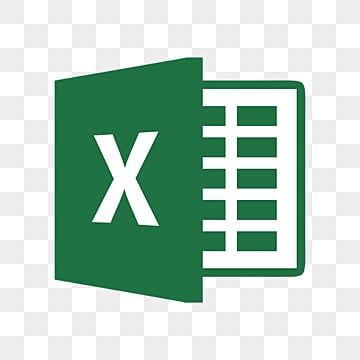

In this part we will work further on the enrichment of data with the help of the software Excel. With Excel we can make calculations, which result in new fields and values. These will be usefull for our final goal, namely data visualisation in the software Tableau and or Power BI.





### 3.1.1 **Calculating date**

Earlier we cleaned the date fields to retrieve one or two four-digit numbers, representing the creation date or beginning/ending of an estimated period. In Excel I want to combine and calculate several things related to these values that will make them more usable for visualisation. For the values to be usefull, they need to be homogeneous. This means that to visually represent a timeline, all date records need to be mapped to a single date. In another instance we can create periods of time and assign a period to each value.

Here is choose for the first case. First I will map every single or double values to 1 value. In this case I could take the lowest value of the two to be the year a work was created. Because that is not always accurate, I decided to take a different approach.

example: a lot of mentions also put a century in 'yyyy' notation. In the case of a teapot with date record that states 1736 first and 1700 (referring to century) this principle assigns the wrong value. That per se is not problematic, but it is if there are better options. In this case I opt to calculate the average of the two values to get a more consistent error.

I try to go one step further. Earlier I also extracted a 'year' field that is occassionaly filled in. If there is a year filled I calculate the average of the three values, instead of the two. Note that this is only done if there is a value that is not null, meaning of the cell is not blank. If the year field is blank, only the average of the two values will be taken into account. This gives me three values to work with.

> Example: if I have a dcdate description with at least two 'yyyy' values such as 1700-1701, I will extract these two values. If there is also a 'yyyy' year indicated in the year field (1700), I will also use that for the average calculation.

**calculation of date in excel formula:**

to get average years with exception of blanks or 0

formula : `=IF(ISBLANK(BJ2); BM2; IF(ISBLANK(BM2); BJ2; IF(ISBLANK(BW2); AVERAGE(BJ2; BM2); AVERAGE(BJ2; BM2; BW2))))`

> example: the average of timespan '1700-1710' and the year '1700', give the year '1703.33333333'

round on 10 years

formula: `=IF(OR(ISBLANK(BO2); BO2 = 1500); 0; MROUND(BO2; 10))`

round on 25 years

formula: `=IF(OR(ISBLANK(BO2); BO2 = 1500); 0; MROUND(BO2; 25))`

example: '1737' becomes '1725'

round on 50 years

code: `=IF(OR(ISBLANK(BO2); BO2 = 1500); 0; MROUND(BO2; 50))`

example: '1737' becomes '1750'

round on 100 years

code: `=IF(OR(ISBLANK(BO2); BO2 = 1500); 0; MROUND(BO2; 100))`

example: '1737' becomes '1700'

Some problems might arise, that justify this average method. If we look at the value below:

> "1914, def 20. Jahrhundert, def XX век, def 1900-luku, def Século XX, def 20 век, def XX amžius, def 20. gadsimts, def 20. stoljeće, def XXe siècle, def 20. század, def 20. storočie, def 20. stoletje, def 20ú haois, def Segle XX, def 1900-talet, def 20ός αιώνας, def 20th century, def XX secolo, def Siglo XX, def 20. sajand, def XX. mendea, def 20. století, def XX wiek, def Secolul al XX-lea, def 20. århundrede, def 20e eeuw, def http--www.wikidata.org-entity-Q6927, def http--id.loc.gov-authorities-names-sh2002012476, def http--id.loc.gov-authorities-names-sh85139020, def http--id.nlm.nih.gov-mesh-D049673, def https--www.freebase.com-m-089_x, def https--g.co-kg-m-089_x, def http--id.nlm.nih.gov-mesh-K01.400.504.968, def http--vocab.getty.edu-aat-300404514, def http--dbpedia.org-resource-20th_century"

This gets cleaned to 1914-1900. Because we take the average, it matters less that year 1 is a later date than year 2. This would otherwise not make sense.

By doing this we achieve a single 'yyyy' value per cel. We end up with several new columns where 'yyyy' gets rounded to 10, 25, 50 and 100. This will create some columns we can play with in Tableau.

### **3.1.2 Calculating longitude and latitude**

In this part I want to calculate an average of the latitude values, and longitude values accordingly.

Sometimes, because of the use of a region, multiple longitude and latitude values are presented in one cell. I want to take the average of this values, as this would result in the middle point of that reason. This is ideal for visualisation, for example in Tableau.

> Example: '53.08333, 52.66538, 52.65, 52.65' becomes '52.7621775'

I was able to do this in OpenRefine (see chapter two). To do this in Excel, I would first In OpenRefine split the multivalued cells into columns. Then I would take the average of all these columns with the condition that they are not empty.

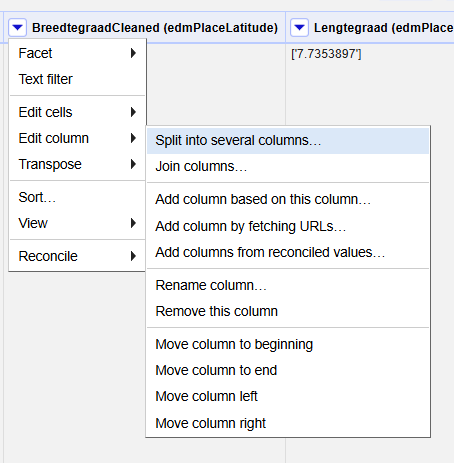

In Excel I would then take the average of these columns, with the exception of not taking a column into account if the value is empty. This might still end up in some mistakes, but most values are covered. You could spot these in a visualisation, for example if a dot ends up in the middle of a sea if we visualize it on a map.

formula in Excel (in case maximum is 3 values, but can be expanded for more): `=IF(ISBLANK(BJ2); BM2; IF(ISBLANK(BM2); BJ2; IF(ISBLANK(BW2); AVERAGE(BJ2; BM2); AVERAGE(BJ2; BM2; BW2))))`

code in OpenRefine: `forEach(value.split(','),v,v.toNumber()).sum() / value.split(',').length()`

### **3.1.3 Calculating sizes**

In this section I want to calculate and group the size related paramaters, in this case width, height, length and diameter.
here I want to do something similar as with the time periods earlier in this chapter. I want to split sizes into segments, in this case rounded on 1, 2 and 5 cm. I will explain the procedure for the diameter parameter, but this can be repeated or the other parameters as well.

first I make sure the data is clean: I make a new column called 'diameterCOPY' and use this formula below. This makes sure the value is taken, and that whitespaces and other unknown or unseen characters are deleted. Before I did this I would get random #VALUE! errors in Excel.

formula: `=IF(ISNUMBER(VALUE(TRIM(CLEAN(G3)))); VALUE(TRIM(CLEAN(G3))); 0)`

after that I use this formula to round. It is similar to the function used for calculating the dates

per 1 cm:

formula: `=IF((ISBLANK(H2*1)); 0; MROUND((H2*1); 1))`

example: diameter of 7,5cm becomes 8cm

per 2cm:

formula: `=IF((ISBLANK(H2*1)); 0; MROUND((H2*1); 2))`

example: diameter of 6,5cm becomes 6cm

per 5cm

formula: `=IF((ISBLANK(H2*1)); 0; MROUND((H2*1); 5))`

example: diameter of 6,5cm becomes 5cm

Once we have fixed all these formulas, we can repeat the procedure for width, hight and length. Finally I also want to calculate an average side size of the teapots. Because often only a length, height, width or diameter.

**'average side size'**

Formula: `=IF(ISERROR(AVERAGEIF(AA2:AC2; ">0"));0;AVERAGEIF(AA2:AC2; ">0"))`

example: if length = 5cm, height = 6cm, width = 7,5 cm, diameter = 0, then the average will be 6,17cm.

per 1cm

formula: `=IF((ISBLANK(W2*1)); 0; MROUND((W2*1); 1))`

example: 6,17cm would become 6cm

per 2cm

formula: `=IF((ISBLANK(W2*1)); 0; MROUND((W2*1); 2))`

example: 6,17 cm would be 6cm

per 5cm

formula: `=IF((ISBLANK(W2*1)); 0; MROUND((W2*1); 5))`

example: 6,17 cm would become 5cm

## **3.1.4 Quick stop in OpenRefine: Europeana Time Logs**

At this point, I decided to extract another field or two from the metadata. I got interested in the timestamp of creation and timestamp of update of the metadata; This will be nice to visualize in Tableau, because we have continuous timestamp data about when the records were uploaded and when they were updated.
Retrieving the timestamp data is easy, as this field was extracted properly from the initial script (chapter one). What we can do is pull up an early version of this dataset and cross reference it with our cleaned dataset to pull out the matching values of timestamps for our actual cleaned dataset.

In chapter two I explained this can be done by making a copy of the column of EID in OpenRefine and use the code below to extract to corresponding column, in this case Timestamp_created. We repeat this process to make a second new column that extracts the data of Timestamp_update. I called my old version 'Timestampscsv' and crossed them with my actual project.

code: `with(cell.cross("Timestampscsv", "EID"), matches, if(matches.length() > 0, matches[0].cells["timestamp_created"].value, "0"))`

code: `with(cell.cross("Timestampscsv", "EID"), matches, if(matches.length() > 0, matches[0].cells["timestamp_update"].value, "0"))`

Tadaa! Now we have added the timestamps to our original document/dataset.

## **3.1.5 Overview of our metadata fields/Dataset**


Here a quick overview of our fields in OpenRefine. It is still messy, but gives a good insight in how many columns we can make and create during the process.

* Title (title)
* TitleLongCleaned (dcTitleLangAware)
* EID
* timestamp_update
* timestamp_created
* EuropeanaLink (guid)
* ImagePreviewCleaned (edmPreview)
* Size(Extent)
* SizeDiameter
* SizeDiameterCOPY
* SizeDiameter1
* SizeDiameter2
* SizeDiameter5
* SizeLength
* SizeLengthCOPY
* SizeLength1
* SizeLength2
* SizeLength5
* SizeWidth
* SizeWidthCOPY
* SizeWidth1
* SizeWidth2
* SizeWidth5
* SizeHeight
* SizeHeightCOPY
* SizeHeight1
* Country3
* SizeHeight2
* SizeHeight5
* LCOPY
* WCOPY
* HCOPY
* AverageSide
* AverageSide1
* AverageSide2
* AverageSide5
* CrossextendedFormat
* Rights
* Country1
* Language
* ShortDescription
* Subject
* Type
*RelatedConceptsCleaned (edmConceptPrefLabelLangAware)
*RelatedCOnceptsCleanedClusteredReconciledExtractedNoDuplicates (EdmConceptLabel)
* RelatedConceptsCleanedBest
* DataProviderCleaned
* ProviderCleaned
* PlaceLabel
* PlaceLabelrecon
* Country2
* LatitudeAverage
* LongitudeAverage
* DateOrigin (edmTimespanLabel)
* FirstFourdigitsYearNumber
* SecondFourDigitsYearNumber
* CombinedFirstSecondYear
* YearCleaned
* AverageTwoYears
* 25verdeling
* 50verdeling
* 100verdeling
* 10verdeling
* 5verdeling




# 3.2 Data Visualisation With Tableau


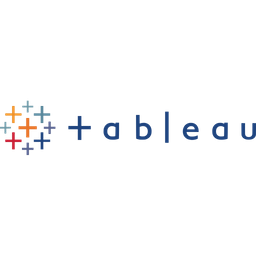

In this part I want to make some data visualisations via Tableau. My goal of interest is to make a story about teapots in the Europeana collection. To do this I will make one or more dashboards. These will consist of several sheets, which represent certain graphs.

## 3.2.0 Exporting graphs in Tableau Public

First of all, it is important to note that it is not intuitively clear on how to save, download and extract graphs from Tableau. Here I want to quickly explain how to do this.

**If you do not save properly, you might loose your data, or might not be able to acces it anymore properly.**

I made my first experiments in Tableau and did not mind to properly save. What happened? I worked for several days and did some concept testing. I did not close my computer or Tableau for this period of time. When I saved my project as Tableau public file, nothing seemed wrong. I saved it as a .twb file. When I tried to open it, it constantly failed to open and gave this error.

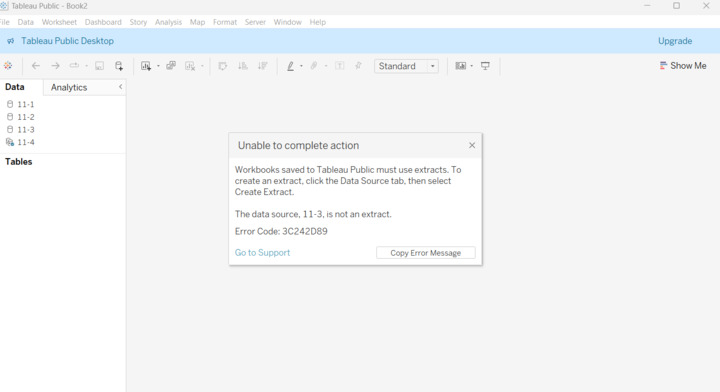


For some reason the dataset had to be extracted. This did not happen automatically. After an hour or two on Reddit and searching the web, I came to the conclusion that this was the problem.

To use Tableau Public, you first need to make an account online. I did not do that. When you save a project in Tableau Public, you upload the file on your account. If you load in a project, it needs to be done from this server. When you upload the project, it also creates an extract of your datasource. This extract is necessary for the workings of your file. Tableau Public cannot use the datasource locally, only via extraction. You can only open project in this way with a paid version of Tableau, namely Tableau Desktop.

It seemed that there was no possible way anymore to extract my datasource without paying; my labor was lost.  Yet, I found a solution, but it was not pretty. To open the project file, I had to torrent and download a cracked/trial version of Tableau Desktop. With this program I was able to open the file and make an extract. After I made the extract, I was able to open it with Tableau Public.

In short: make an account on Tableau Public and save a test in your Tableau Public to check if your connection is working and no problems will arise later.



## 3.2.1 Sheets

Now we can start working in Tableau Public. First I will explain a bit of the ontology and concepts to work with in Tableau. Here I want to briefly discuss the concept of marks, filters, columns and rows and graphs.

Without going into much details, as these concepts are well documented on the internet.

What I want to simply explain here: first of all you load in a dataset, in this case the one you cleaned up and expanded on in Excel. After uploading this dataset, you can click on the sheet tab. From here on you get the workview to create graphs. Here you can place data in columns and rows. Secondary you can add marks and filters. filters are explanatory. However, it is important to note that there are several types of filters. here I mostly use the list and top one. The first one lets you select or exclude certain facets. The second one lets you pick a list of highest values, for example a top 10 of highest number teapots.

In a second conceptualisation we can think about the sheets, dashboards and stories.


### 3.2.1.A Content

In tableau we can load in a dataset (or multiple) and create graphs in so-called 'sheets'. These sheets are a sort of workspace to create a graph. Below I will construct several visualisations. I will also add the visualisations here and the tableau file will be in the Github repository.

First of all, what I did, is to rename some of the fields that I wanted to use. Sometimes I have done this during the creation of a sheet. The reason for this is that the field name can sometimes be usefull, because it is sometimes shown in the sheet as the name of an axis.

> example: I have three country fields of which I want to use two. My country 1 field from my OpenRefine/Excel can be renamed to Country of Organisation, because it refers to country of organisation. My country 3 field can be renamed to Country of Origin, because this value refers to where the items (teapot) in this record originates from/is found.


> example: another example is that size names. I had something like 'Height1', which I renamed to 'Size Height (per 1cm)', because this shows much better on the graph and is more clear to me or the client.

> Example: 'relatedconcepts' gets renamed to 'materials', because we will only look at the materials of teapot records.

#### **Sheet 1-3: Pie Charts: Licenses**

To start off easy, I want to make a visualisation of the intellectual property rights that are connected to the items, in this case the license for teapots and their image(s).

In Tableau I made three pie charts:
1) the first one shows the distribution of licenses over all items
2) in the second pie chart I choose to only visualize the licenses of Rightsstatement.org
3) in the third pie chart I choose to only visualize the licenses of Creative Commons.

Interesting to note is that there are 2 clusters of licenses, namely licenses from Rightstements.org and licenses from Creative Commons. Below I provide an overview of what I placed where in the worksheet in Tableau. In this case I put the CNT(allteapots) in the rows and the rights field into the columns. I then clicked on the pie chart map in the right part of the Tableau interface. This resulted in empty rows and columns. They were replaced to the marks field automatically by Tableau (see photo below).

Rights gets a colour mark. This gives every facet of Rights a different color, in this case ever slice of the pie represents a different right and gets a different color.
The size of a slice and the slice shape are defined on the basis of the COUNT(allteapots). This COUNT(allteapots) is a measure that is constructed automatically by Tableau. It counts the number of records used for the visualisation. In this case it has a mark for the angle and a mark for the size. At last, we can see a label for rights. This makes sure the labels of the rights are shows in the visualisation, for example 'PDM 1.0'. The label for COUNT(allteapots) shows the number that the slice of pie represents, for example '701'. For the filter I used an exclusion of the 'null' values, to clean my visualisation.



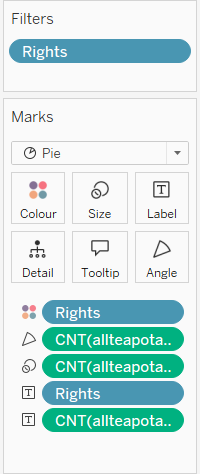




This results in this pie chart for all licences:

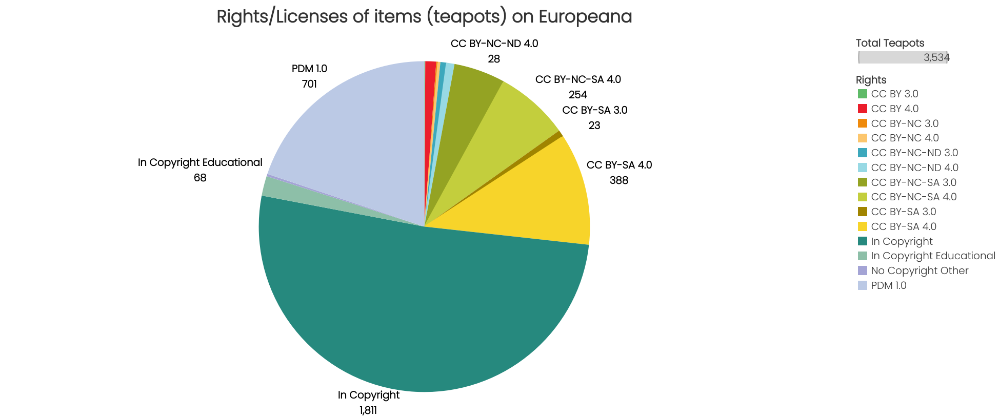




What we can do next to visualize only the Creative Commons (CC) or Rightsstatements (RS). We can set a filter and select manually to be included in the selection. In this case for CC or RS accordingly.

example: for RS we select the three corresponding values in the filter (by right clicking on the Rights field): Public Domain, In Copyright Educational and In Copyright. This gives us a pie chart of these values.

This results in this pie chart for Rightsstatements:

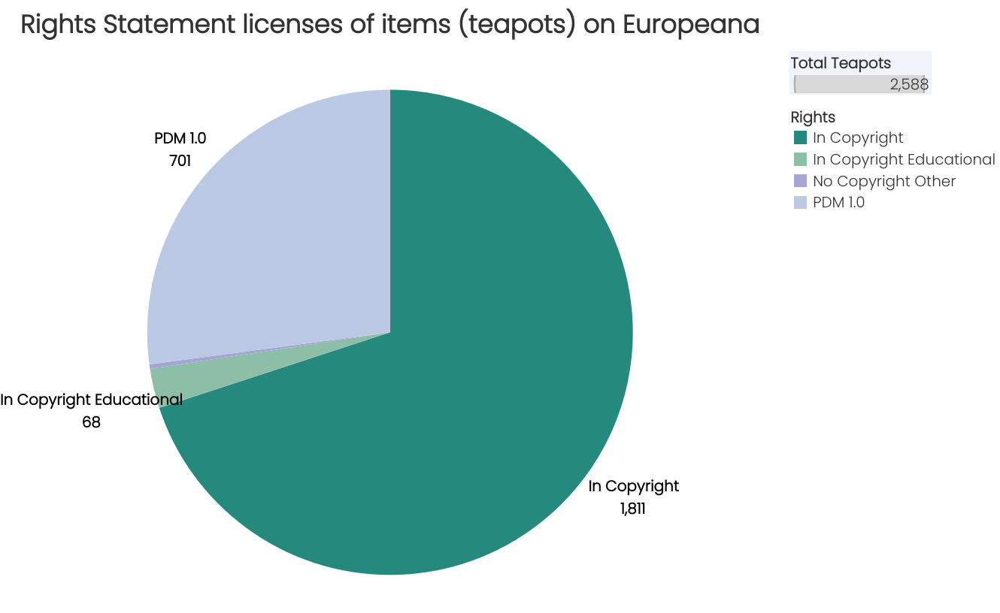

If we repeat the process for the Creative Commons Licenses, or simple edit the filter and select the exclude function. This will make a reverse of the filter and in this case select only the licenses from CC. This results in the chart for the Creative Commons licenses:



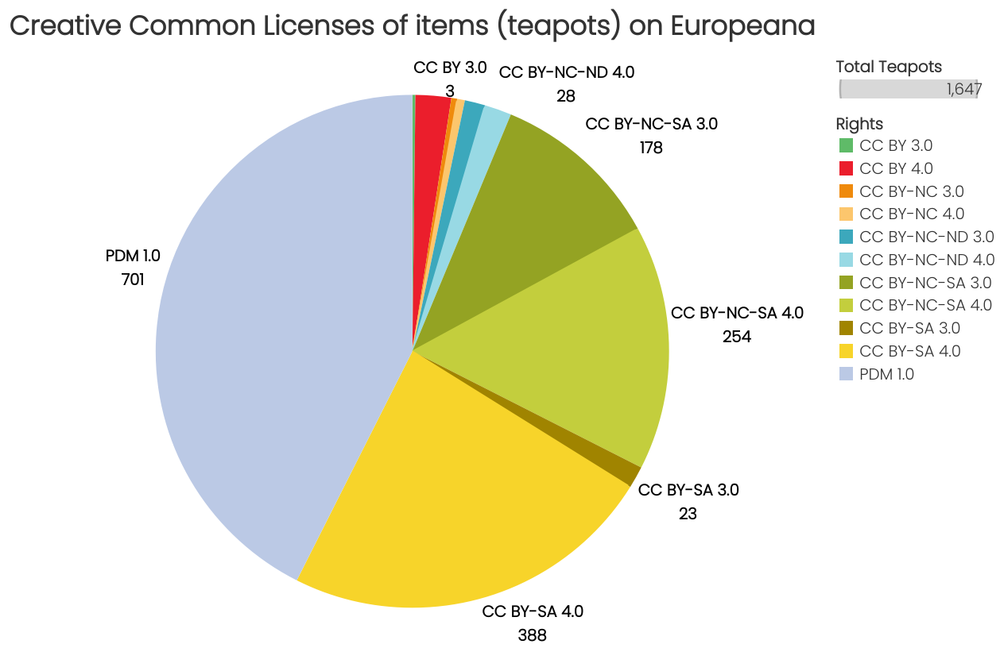


Note that I will not talk about layout here. This would take too much space to account for in detail. I will address this in a separate section of this chapter.

##### **Analysis**

If we look at this data we can see it is complete. In the graphs the public domain licences of CC and RS were joined. We have a total of 3542 records, of which 701 are public domain. Via the RS chart we can see that 1811 of works are 'in copyright'. As it may be unclear how these can be reused, these items have to be marked. The teapots under the CC licences can be used depening on the license. The results above can be used to select only the images of teapots that are under the public domain, so they can be used on a website or publication without issues about intellectual property rights.

It could be interesting to create a pie chart that shows percentages, or to create this pie chart as a donut chart.




#### **Sheet 4-5: packed bubbles graph and bar chart: Organisations**

In this part I will analyse data regarding the organisations that contributed that items to the Europeana platform. Here I opt for two visualisations to see what are the biggest contributors to items related teapots on Europeana, and to see how much to contributed (proportionally).

In the first graph I create a bubble pack without a filter. Here the circles represent the size of the contribution. This also shows us the big amount organisations that have put up records of teapots.

To do this I put my measure COUNT(allteapots) to the rows and my dimension organisation to the columns. Next I selected the visualisation of 'bubble pack' on the right (by clicking the 'show me' button). Next I edited the filter to exclude the 'null' of organisations. Below is picture of my settings:


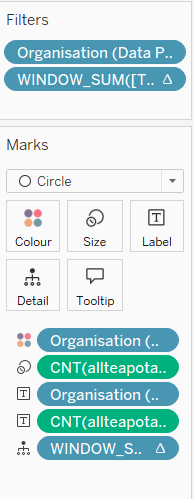

After selecting the bubble pack I have nothing left in my rows and columns, but only marks and filters. First I filter to exclude the null or blank data from my organisations list. Again, this cleans up the visualisation. Next I added a colour mark for the organisations and a size mark for the CNT(allteapots). The colour mark gives every organisation a separate colour. The size mark makes the bubbles appear larger if there are more teapots of that organisation. Again there are two label marks, one to show the number that each bubble represents and one to show the name of the organisation in the bubble. Lastly, I add a mark for the window_sum(cnt(allteapots). This calculates the total sum of records used for this visualisation. Because I could not solve how to show a total sum of the records used for the visualisation, I came up with a solution to put a filter on the window_sum and select to show to filter. This shows the filter as a legend. From here on I customized the settings to remove all values and layout except for the total count, so that it looked like a view of the total number of records. These adjustments can be done be right clicking on the legend.

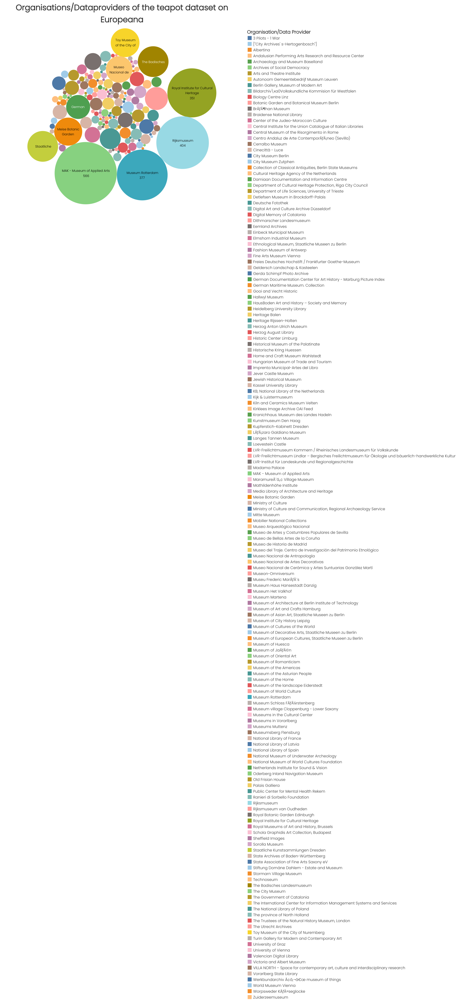

In the second graph I create a bar chart of the top 10 contributors. This gives a clear view of which organisations contribute the most and how much they contribute. To do this I put the CNT(allteapots) in the rows and the dataprovider in the columns. I then add a filter on the dataprovider and select the tab from 'general' to 'top' to be able to set the top 10 parameter correctly. These are my settings:

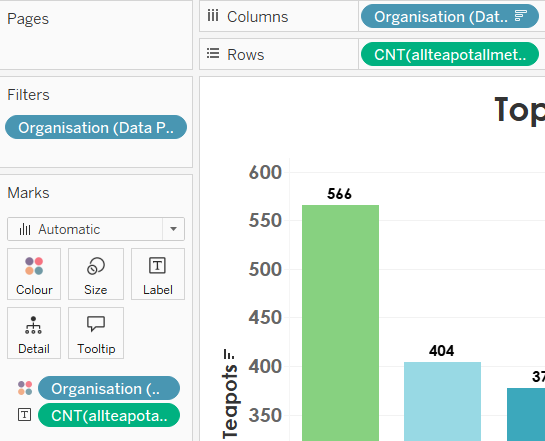

This results in this graph to show the top 10 organisations that contributed to this dataset.

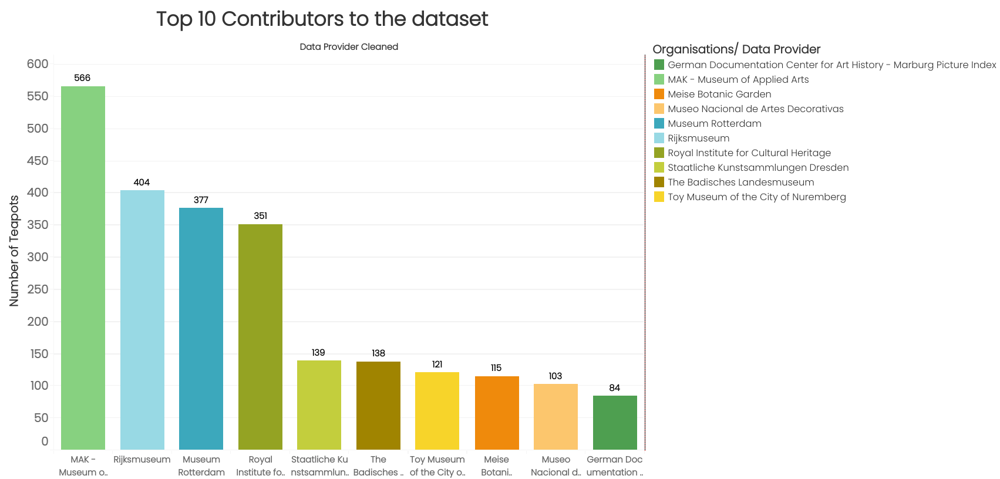

It may be interesting to note that one of the top contributors is Meise Botanical Garden. Based on the name, items of this organisation might not be teapots, but rather tea or plant material. In that case, it could be removed from the dataset.

##### **Analysis**

From the graphs we can conclude the following: there are several great contributors and a lot of small contributors to this dataset.

In the bubble pack we can see the (amount of) different organisations that contributed.

In the bar chart we can see the top 10 contributors and the amount they contributed. Below is the top 5 and the respective count of records about teapots.

- Mak (566)
- Rijksmuseum (404)
- Museum Rotterdam (377)
- Royal institute for cultural heritage (351)
- Staatliche Kunstsammenlungen Dresden (139)

It could be interesting to calculate the number of distinct elements in the organisations field. This would show us the number of different organisations that contributed to this dataset.

#### **Sheet 6-9: Geographics and (stacked) bar chart: Locations/Countries**

In this part I will make a visualisation of the countries of origin of the teapots in the Europeana collection. I wil use a maps for this. I will show the global spreading of teapots and will also provide a visualisation with focus on Europe. Next I will also make a stack bar chart with the number of teapots and the countries. In the bars of the countries I will stack the cities corresponding to that city.

To begin with the maps. First I dragged the country of origin into the columns and CNT(allteapots) to the rows. Next I clicked on the maps icon to visualize the chart as a map. This changes the rows and columns automatically to lonitude and latitude (that it generates on the basis of these countries). Next I filter the results of country of origin to exclude nulls. Next I use a color mark on cnt(allteapots) and a detail mark for the country of origin (this should already be there after clicking the maps charts). In the image below you can see the setup:

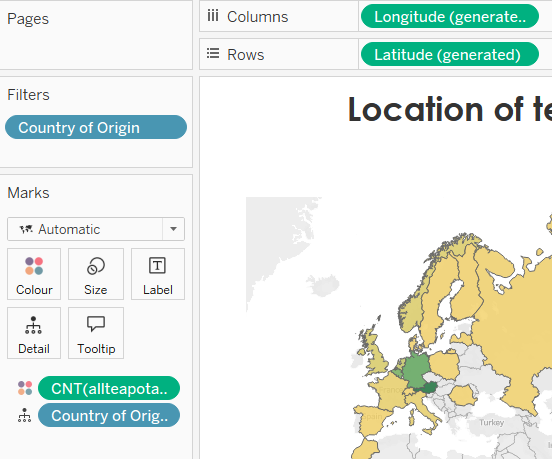

This results in the following map chart to show number of teapot records per country:

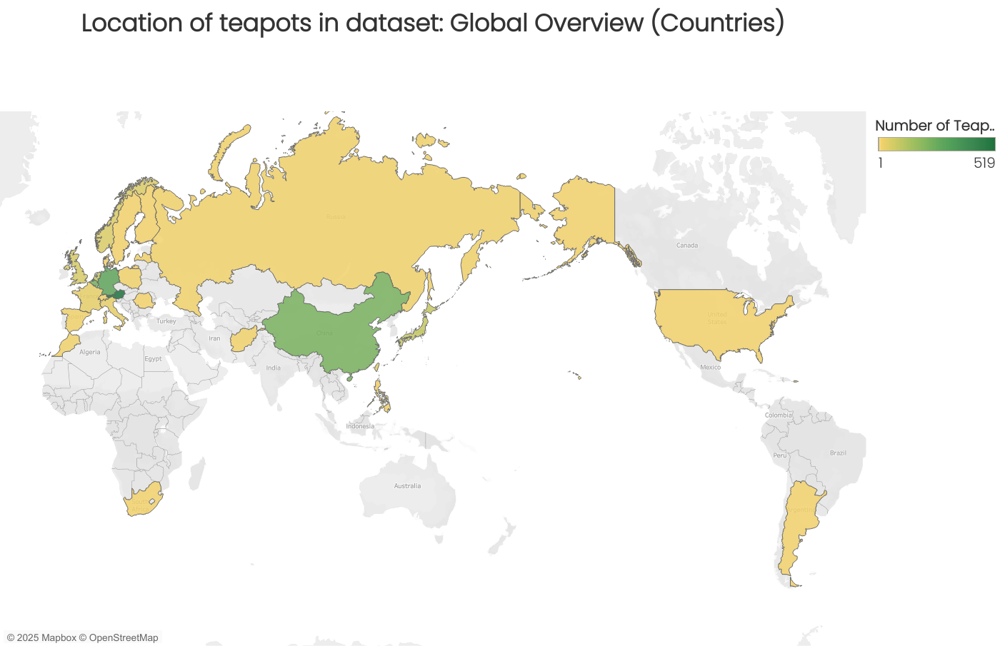

Next we take a close up in Europe. This can easily be done by using a filter to exclude all non-European countries by hand. We also zoom in on Europe with the map menu. I also put a label mark on cnt(allteapots) to show the number inside the country.

result:



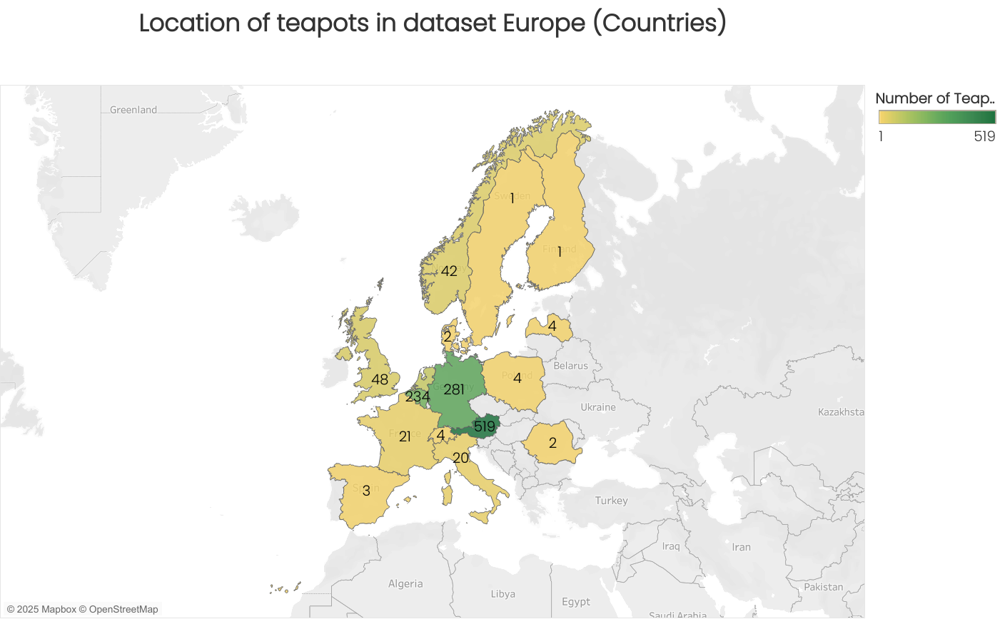

To visualize the data in a different way I want to make a stacked bar chart of the top 10 countries where the most teapots are found, and also show the city locations that correspond to these countries. To do this, I placed the Country of Origin in the columns and the cnt(allteapots) in the rows. Next I added a top 10 filter on the country of origin. Next I also added a filter to exclude the null (blank) values. Next I added a color mark for the cities and a label mark for the cnt(allteapots). Finally, I select the stacked bar chart from the graph menu.

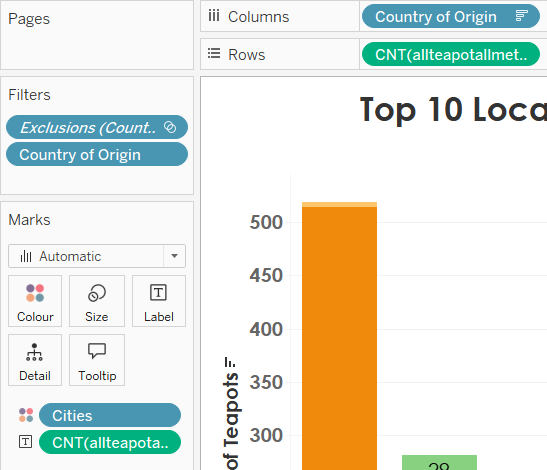

This results in the stacked bar chart below:

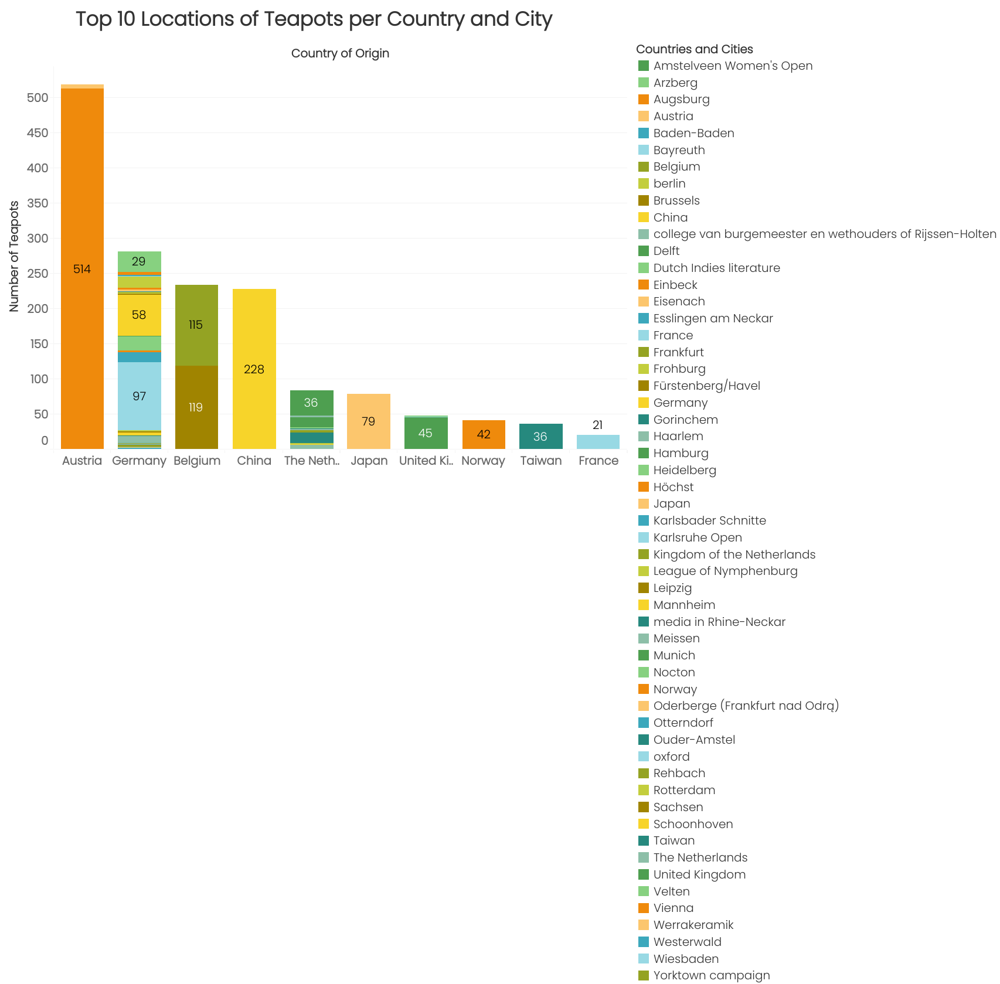

Next I also make a graph to only show the top 10 cities where the most teapots originate from. To do this, I put my cities in the columns and my cnt(allteapots) in the rows. For filters I excluded all the countries in the list of cities by hand. I also excluded the null or blank values. Next I added a color mark for the cities and a label of the cnt(allteapots) to show the numbers above the bars. This results in the settings below:

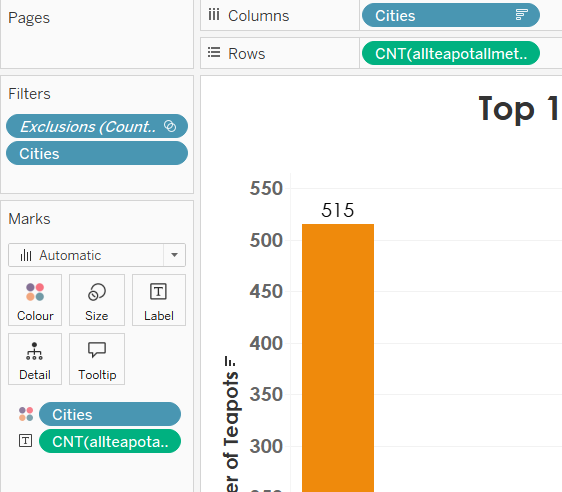

This results in this bar chart:

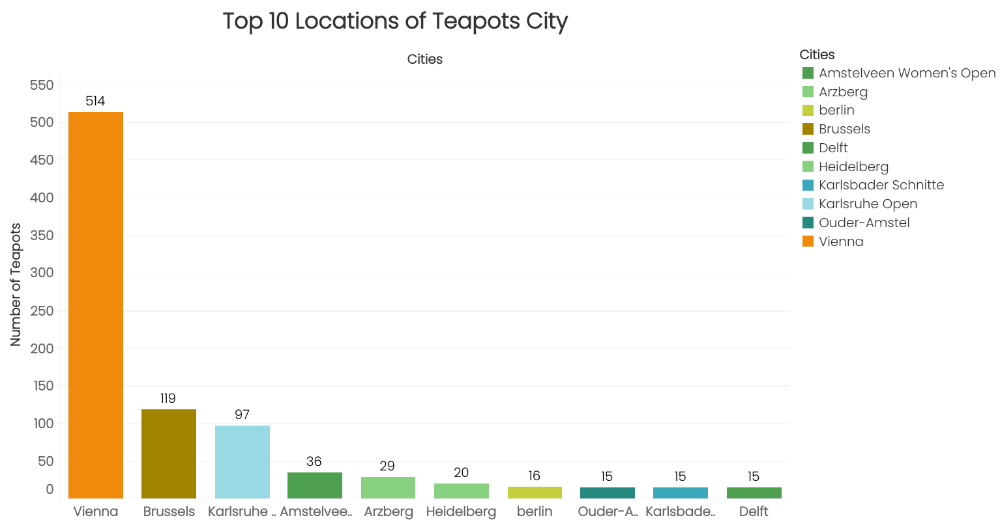

##### **Analysis**

From the graphs above we can conclude some information about the locations of teapots in our dataset. In the first graph we can clearly see highlights for Austria, China, Belgium and Germany. These seem to be the spots where the most teapots are located. If we zoom in to Europe (second graph), we can see most activity in Austria, Belgium and Germany. This data is confirmed by the stacked bar chart about the countries, where we can see these 4 countries arise at the top. If we look at the distribution per city (graph four), we can see the highest number of teapots at the cities of Vienna (Austria), Brussels (Belgium) and Karlsruhe (Germany). This corresponds with our data about countries. Also interesting to note, is that we do not have many city variation in countries, except for Germany.


#### **Sheet 10-12: Treemap and highlight tables: Materials**

In this part I want to focus on visualizing the material info about teapots in our dataset. First of all I want to make a top 10 of the materials that are most present in the dataset. To do this, I put the materials in the columns and CNT(allteapots) in the rows. Next I click on the treemap in the graph menu. This results in empty columns and rows, but creates a size mark and a color mark for cnt(allteapots). The label mark for materials makes sure the name of the material is shown. The label for cnt(allteapots) shows the number of teapots for that material. Lastly, I put a filter on materials so that only the 10 with the highest count are shown. I do this by clicking on every block that is not a material and exclude it manually from the graph (for example labels such as paper, teapot, etcetera).

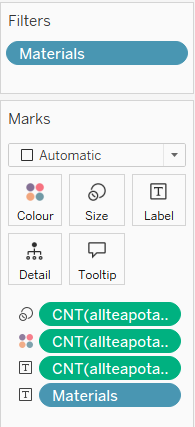

This results in this treemap for the top 10 materials used for teapots in the dataset.

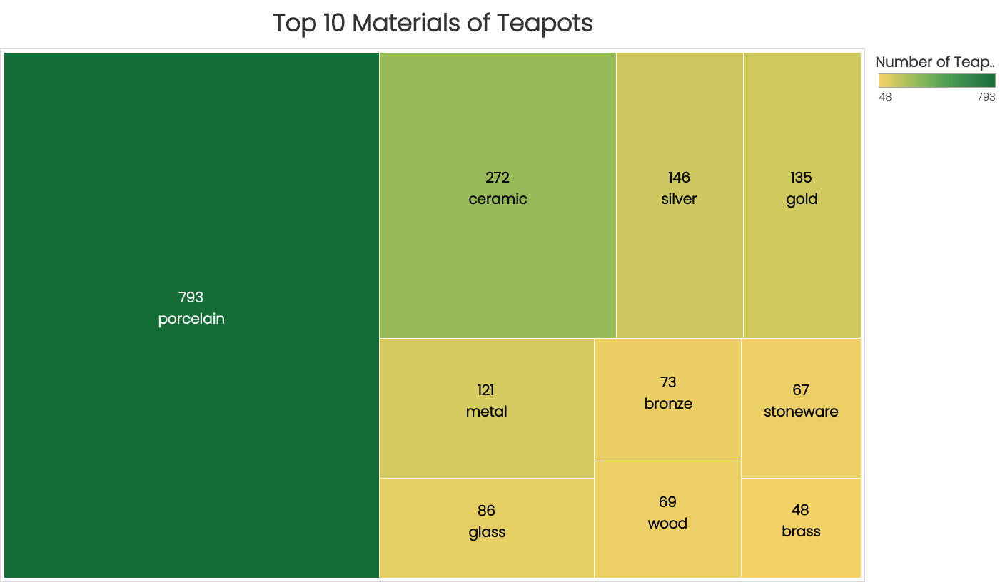

We can also present the same data in a small highlight table. To do this, we first make a duplicate of the chart above. Next we chose the small table graph. This brings the materials dimension back to the columns. In the filter we still have the condition to show the top 10 number count of materials. CNT(allteapots) has a label mark to show the numbers in the graph. Cnt(allteapots) also has a color graph to indicate how high the number is in comparison to the other values.

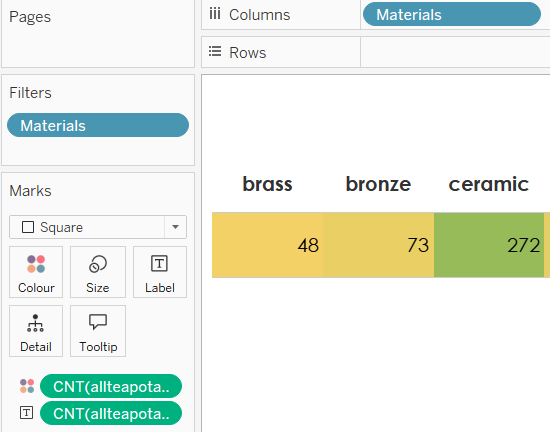

Via the analysis tab we can add a grand total to get a total sum of all records that provided data about these top 10 materials.


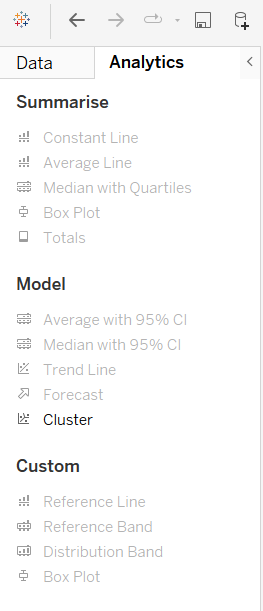

This results in the table below to show the top 10 used materials for teapots.

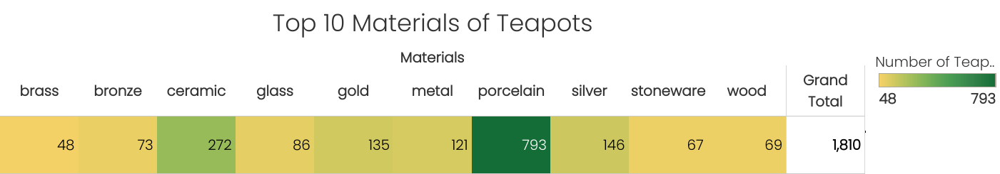

In a third movement I want to visualize the top 10 materials of teapots per country. To do this I have to adjust the settings. This time I place materials in the columns and Country of origin in the rows. I place a filter for top 10 on materials. In the chart menu I select highlight table. I also put a color mark on cnt(allteapots) to color and a label on cnt(allteapots) to show the numbers. This results in the settings below.

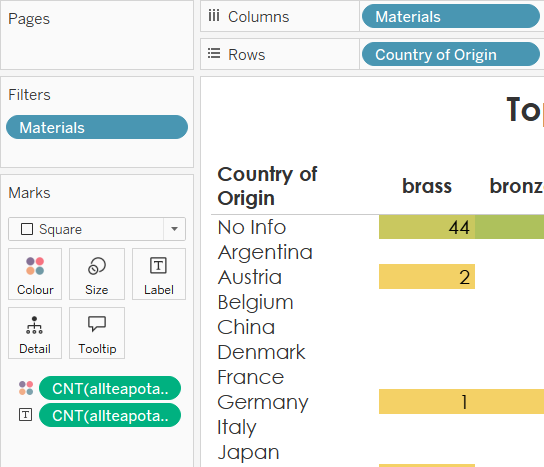

Below the complete table is shown. Here we see the top 10 materials of teapots and their number per country. I also added a grand total via the analytics menu. I dragged one to the right and one to below. That way I get two rows of totals.

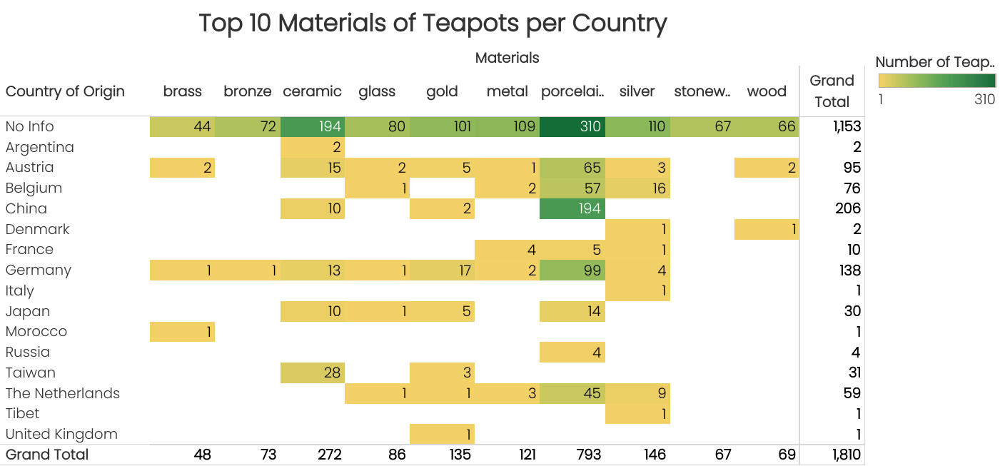

Again, we have to be cautious, because these total counts can represent number of rows, or only records that are not blank/null. This means we will get all kinds of results. Above we see 1810 as grand total, but we know that those are the records with data provided. In total we have around 3500 teapot records.

##### **Analysis**

From the analysis of the materials of teapots in our dataset we can conclude which are used most over time and per country. If we look at the top 5 materials, these are porcelain (793), ceramic (272), metal (121), silver (146) and gold (135).

If we look per country, we can see a lot of data missing. If we look beyond that, we can again see most records are from China (206), Germany (138) and Austria (95). We can conclude that in all of these countries 'porcelain' is the most used substance or material of teapots in our collection. Again this is the case for China (194), Germany (99) and Austria (65). This is also the case for Belgium and the Netherlands (45).

#### **Sheet 13-14: Line Graph and Bar Chart: Time overview**

In this part I want to visualize the number of teapots per year. In this case I took the year of creation of a teapot and grouped it per 25 years (see chapter two). Below I created a simple bar chart by putting the years per 25 in the columns and the cnt(allteapots) in the rows. Next I clicked on bar chart. Next I filtered away the 0 and null values. This created the graph below.

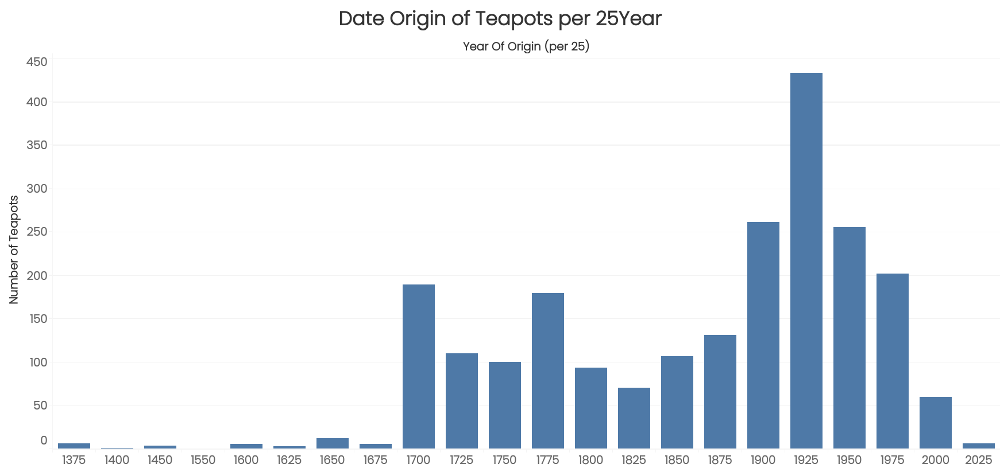

We can also visualize time in a different way. If we change the parameter year from discrete to a continuous value, we can draft a line chart instead of a bar chart.

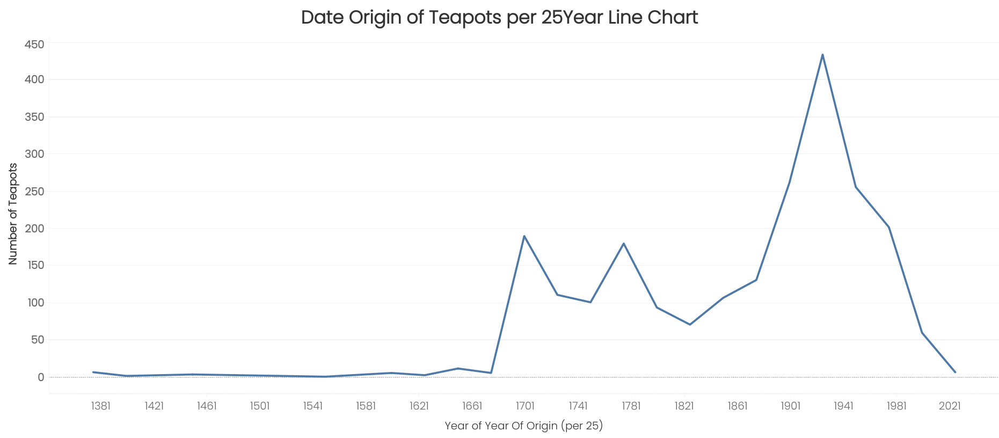

##### **Analysis**

If we look at the two graphs above, we can see that teapots in our dataset originate from around 1600's until now. There might be several explanations for this lack of data for the period before. This may simply have to do with language (was the word 'teapot' used before this time or do we more have to look into the direction of 'kettle' or 'cauldron', a pot to boil water and so on). This can also have a cultural explanation; was tea maybe used less in the period before? Did we record it differently? We know people drank tea before 1600's, right? Many questions arise here, yet it is exciting to see these results.

If we look at the top periods in our collection we can see a spike around 1700 and a spike between 1900-1950's. This is very interesting because we now have two periods where more teapots arise than in other periods of time. These could be studies separatly. This phenomenon in the data could also have several explanations of error I cannot go into here. For example: I have calculated an average of 1 to 3 values. Many things can go wrong with the input or the data involved, which may represent the data of origin differently for some records. Again, many questions arise here,  yet it is interesting to see these trends in time in our dataset.


#### **Sheet 15-17: Line Graphs and Surface Area: Materials over Time**

In this part I want to create a surface area chart visualizing the materials used for teapots over time. To do this I put the year of origin in the columns. Make sure it is set as a time-date structure. this can be done by selecting the field in the columns and choose this setting (see below). Also note that the value is set as discrete instead of continuous. In the rows I put cnt(allteapots).

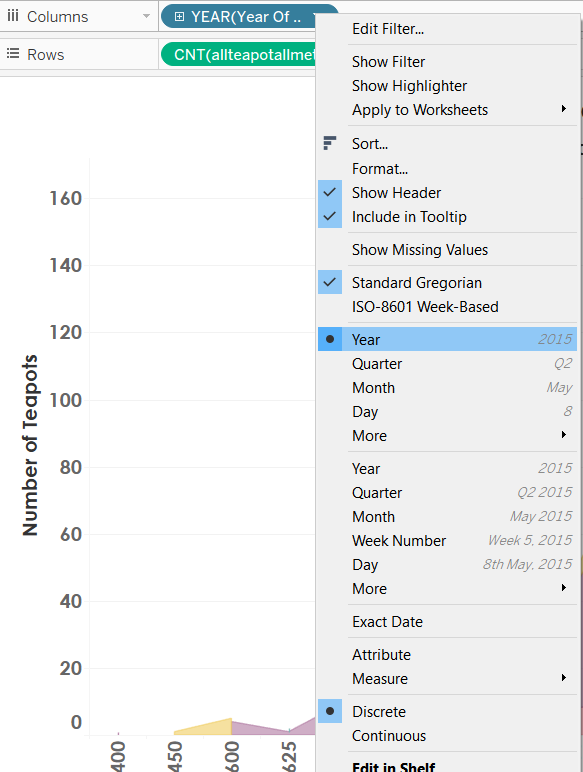

For the filter I again selected the top 10 materials. Next I also put a filter on the year of origin. With this filter I deleted nulls and blanks, I also deleted values such as 1000, because I know this value is wrong.

I think the color mark for materials is put there automatically when choosing the surface area chart in the chart menu. I did put a label mark on materials to show the name of the material in the graph.

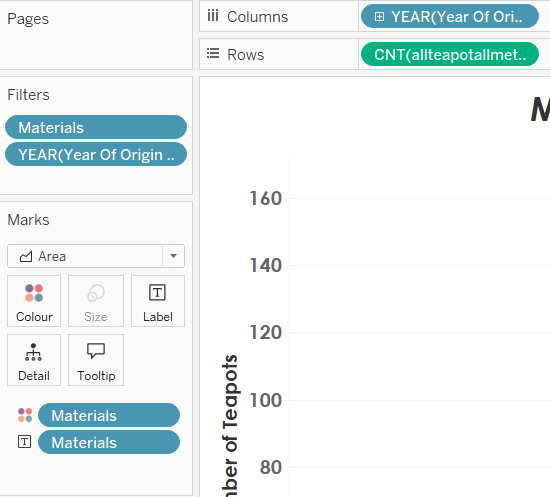

This results in the surface area chart below:

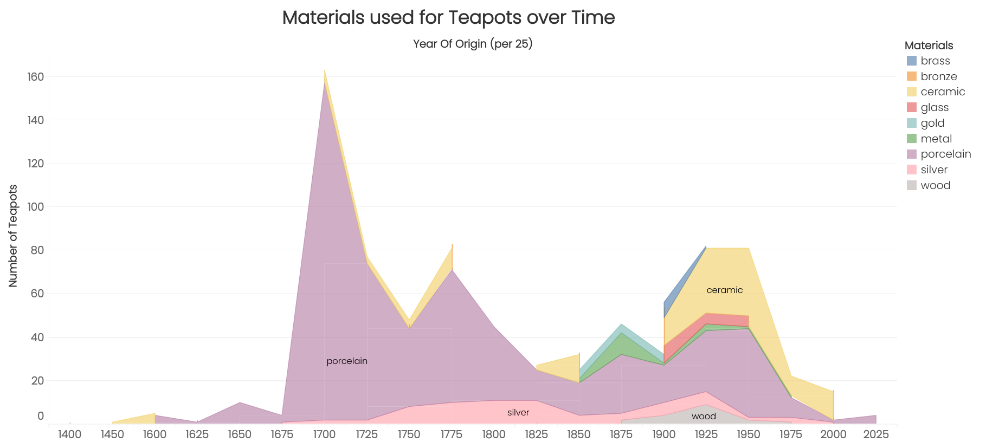

Another way to visualize this data, is by creating a line chart. This can show the evolution of the materials individually, instead of summed together. It is important to change the YEAR(year of origin) to a continuous function instead of discrete, because this will make it possible to create line charts.

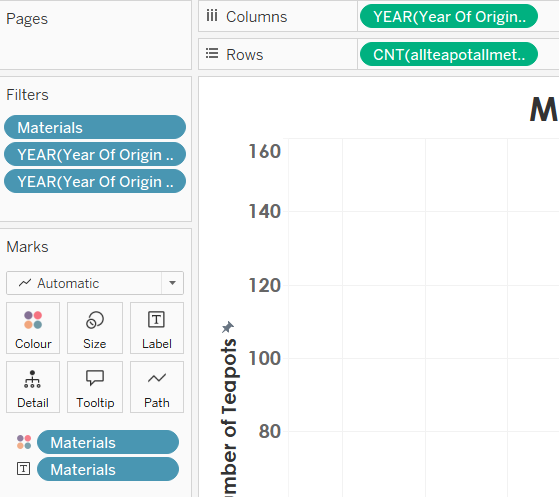

If we use the settings above, we get the line graph shown below:

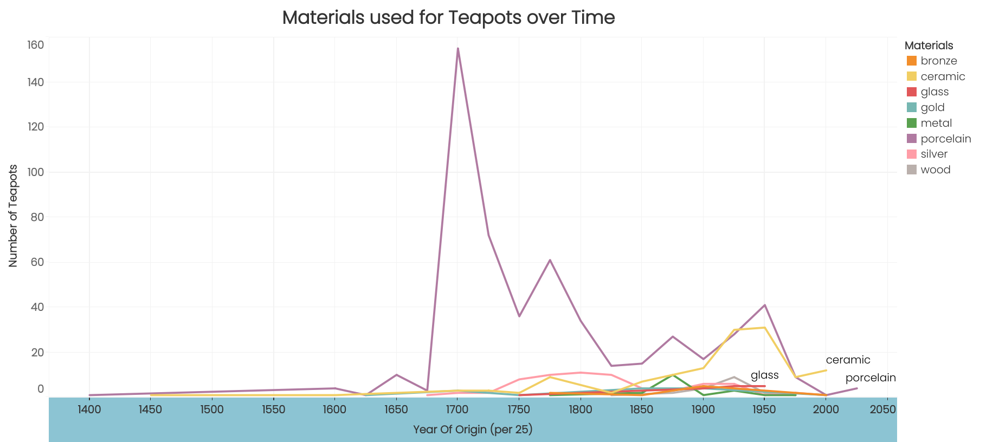

##### **Analysis**

With the graphs above we build upon the earlier graphs about the time of origin of the teapots in our dataset. We can clearly see a spike for the material 'porcelain'. From the 1850-1950's we see a spike in the use of porcelain. between 1875 we have a little spike of metal usage and gold usage. Around 1925 we see the use of brass, glass and metal. Interesting to note is that we see the usage of silver evenly spread from 1725 to 1925. I really like the surface area chart, because it shows the total material use over time.


#### **Sheet 18-21: Line Graph, stacked bars and trends: Europeana Timestamps**

In this part I want to create some visuals regarding the data that gives information about when the record was created and updated on Europeana. The reason I have also chosen this data, is because it is continuous and has a date-time structure that I could not find anywhere else in the dataset. With this continuous data I can experiment with different time signatures.

First I make a double chart of the data records created and updated over time.
To do this I made two graphs and put them together. In the rows I put CNT(allteapots) and in the columns I place timestamp created and timestamp updated. Before dragging them into the sheet, I make sure that they are set as a time-date structure by right-clicking on it and selecting it from the list accordingly. This makes it so that I can choose to view the timestamp per year, quarter, month, week, day, hour, and so on. Here we choose for year (see below).

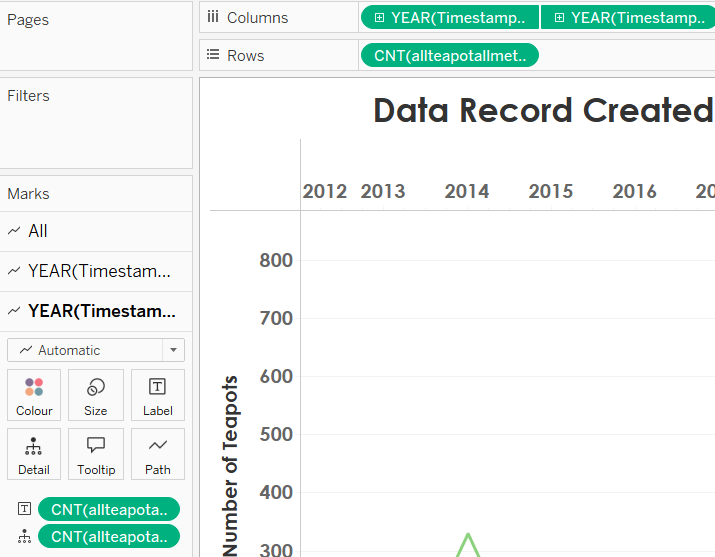

I placed a label mark with both the timestamp variables, so that the lines in the chart are labeled with 'timestamp created' and 'timestamp updated'. I also decided to add trend lines to the charts. These give a prediction of the values in the future. This results in the two line charts below.

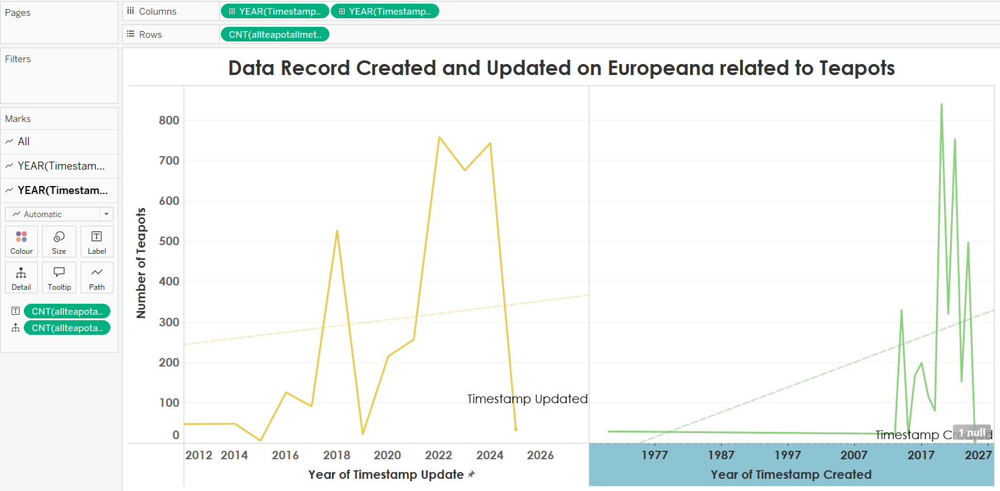

To put the two graphs together, one can right-click on the axis of Timestamp Created and select dual axis and synchronize axis. This results in the line chart below. It shows all data regarding timestamps of creation and updating on the Europeana platform for records about teapots over time (in this case years).

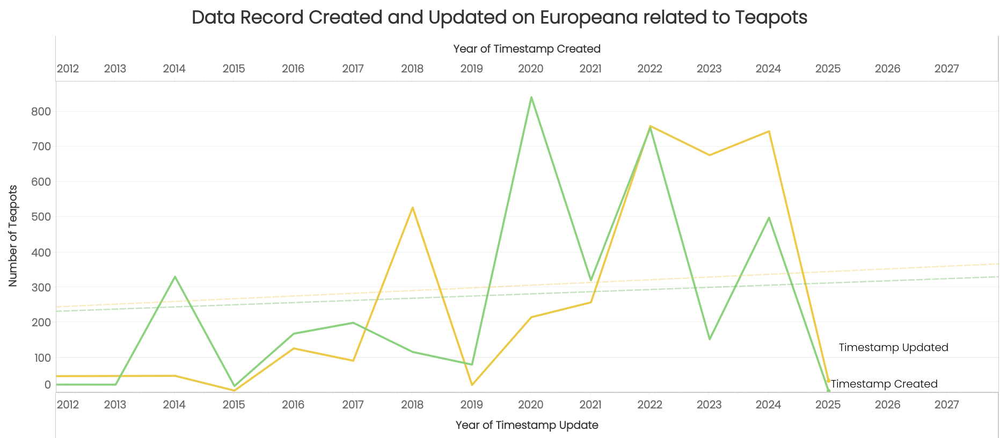

Next I want to show the year, quartier, week function of this data structure. We can for example focus on weeks. To do this we click on the plus in front of YEAR in the columns fields. This will change the settings from year to week. If we click on the axis of week of timestamp update, we can edit it so that it only shows a specific range, for example a couple of months in terms of weeks. For these graphs I also changed to color via the color mark. I did the same for the trend lines. This was done via formatting. All these actions result in the graph below:

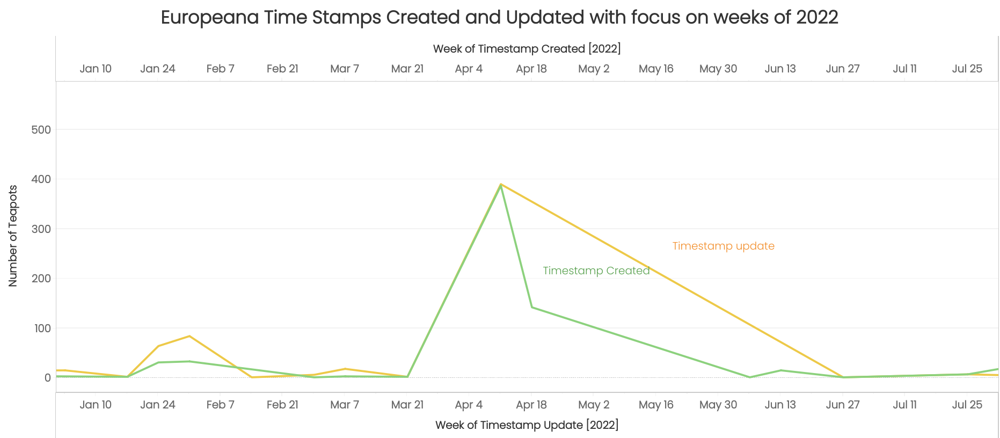

Next I want to create a more complex graph about the timestamps. I want to show the creation of timestamps over time per country. I can do this by making a lines chart.

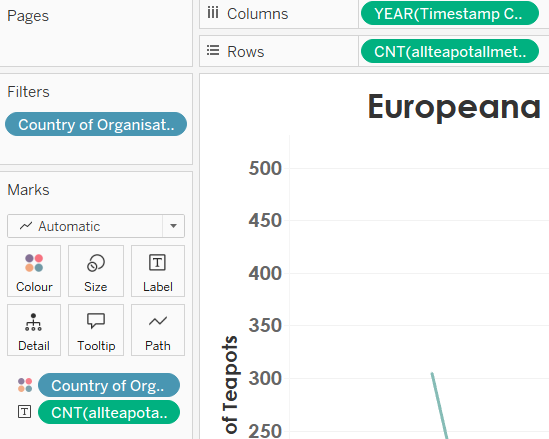

In the graph below we can see the time stamps of records that are created and contributed to Europeana per country. Each line represents the evolution of uploads by a specific country. I also added trend lines to present some expections of the number of uploads per country for future time. The graph may seems a bit chaotic at first, but proofs to contain a lot of usefull information.

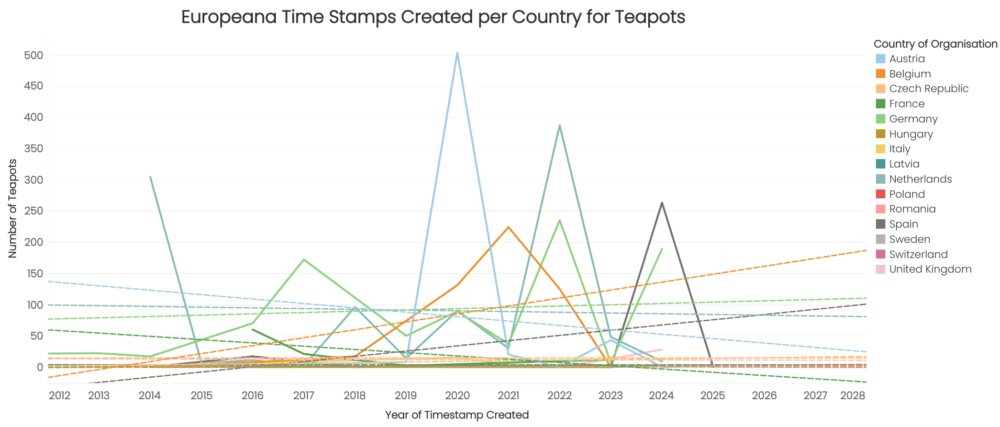

To get some more overview of the data presented above, I will make another visualization. In this case I will show the time stamps of creation of records in a bar chart. This shows the number of records over time, but the bars are stacked so that we can see which countries contributed how much each year.

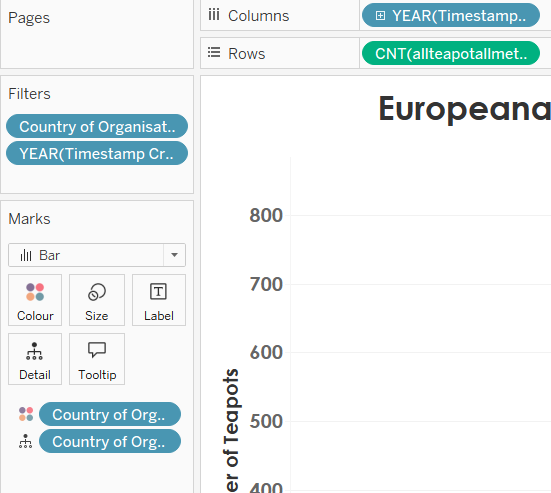

This results in the bar chart below:

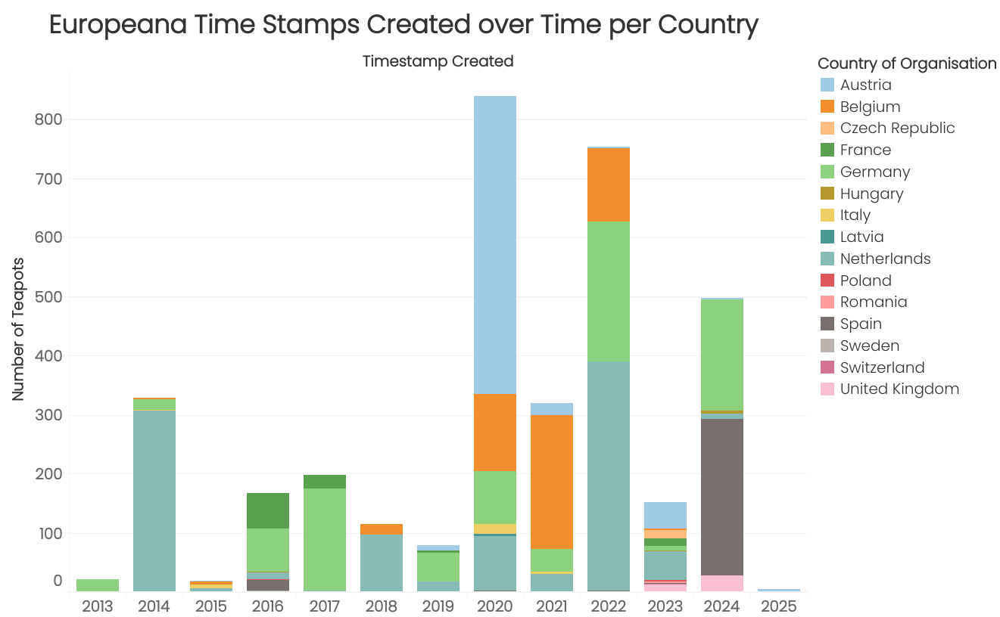

##### **Analysis**

If we look at the data we can see several things:

1) Looking at the first graphs we can see how much records were created and updated on Europeana. Since the start of Europeana (2012), we can see more records being uploaded every year.

2) It is interesting to see that there are waves of creationsand waves (or spikes) of updates.

3) countries upload in bulk and year specific. We can for example see how spain joined uploading more in 2024. Before not a lot was present. Might this have to do with them joining/investing more since then into Europeana, or is this computer coincidence?

#### **Sheet 22-26: Bar Charts: Size**



In this part I want to gain insights in the size data related to the teapots in our dataset. To do so I will have to make several charts, as I have information about length, width, height, diameter, and average side size.

I also added an average line. I did this by going to the analytics page (next to data on the right). Here I dragged the average onto the sheet.

I also added the cluster function the possibly gain more insights. This groups data with similar values. In the graph below this for example clustered the data in 5 groups, which values are similar. This gives a nice visualisation of the data, as we can now see that some of the highest values are the same.


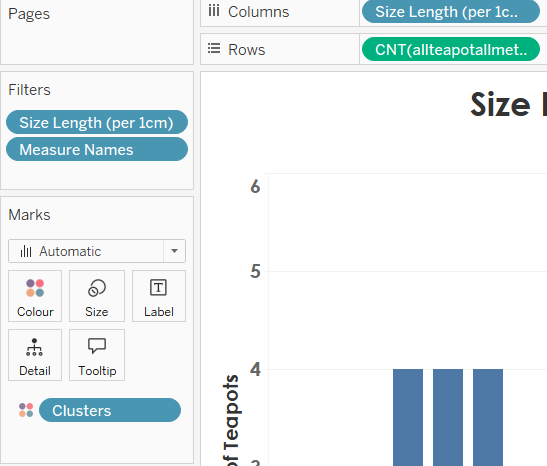

If we repeat the process for Length size, we get the results below:

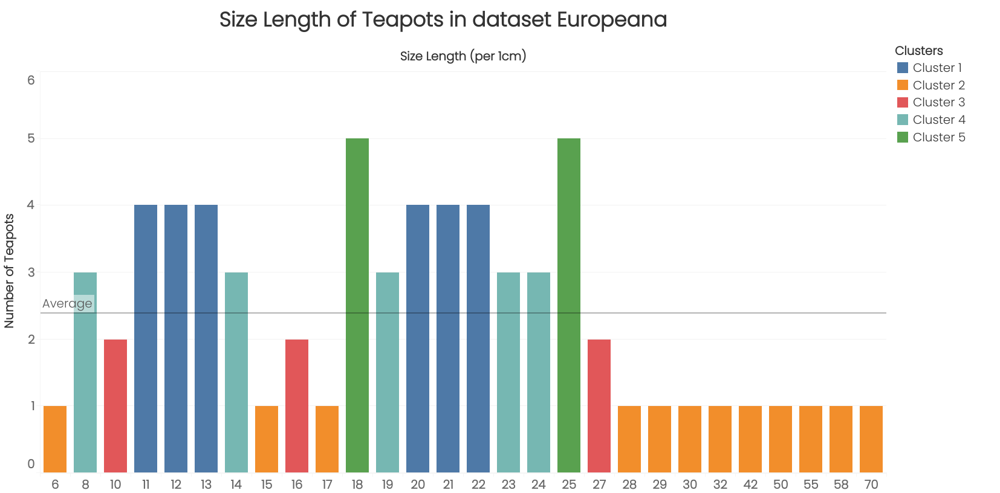

If we repeat the process for width size, we get the results below:

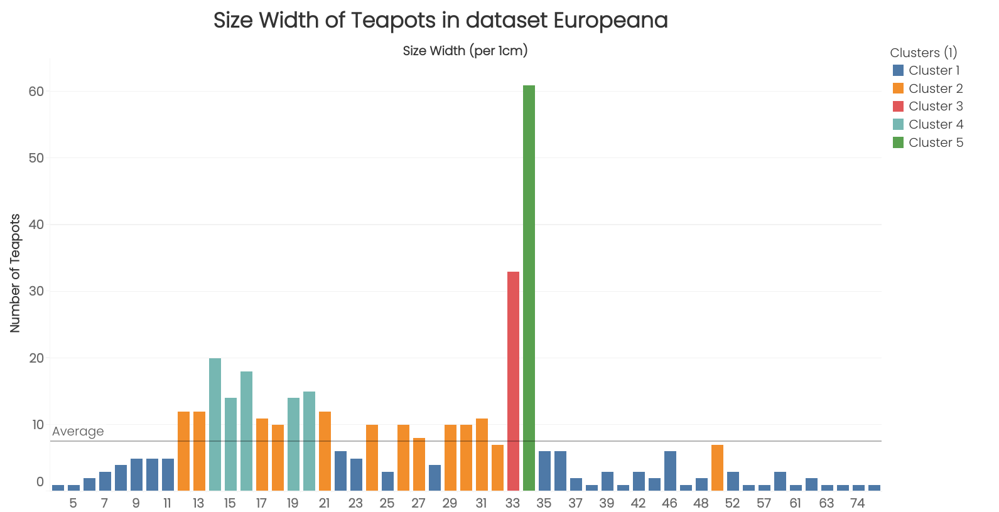

If we repeat the process for height size, we get the results below:

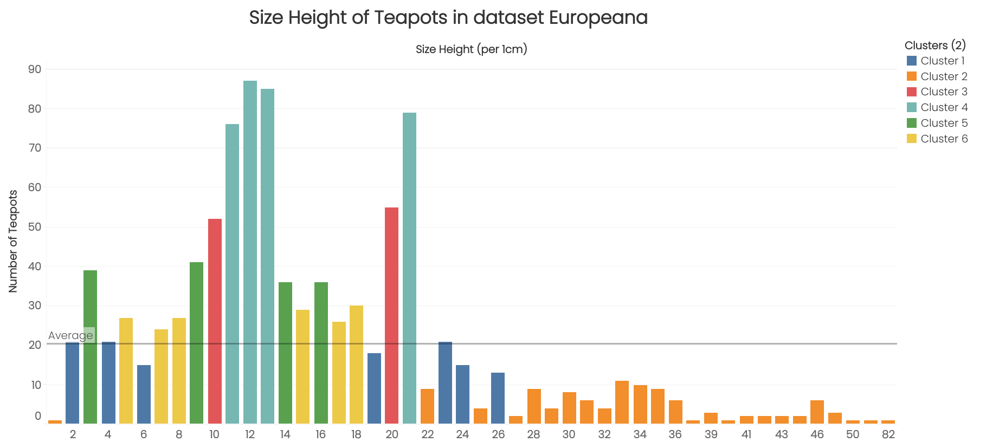

If we repeat the process for diameter size, we get the results below:

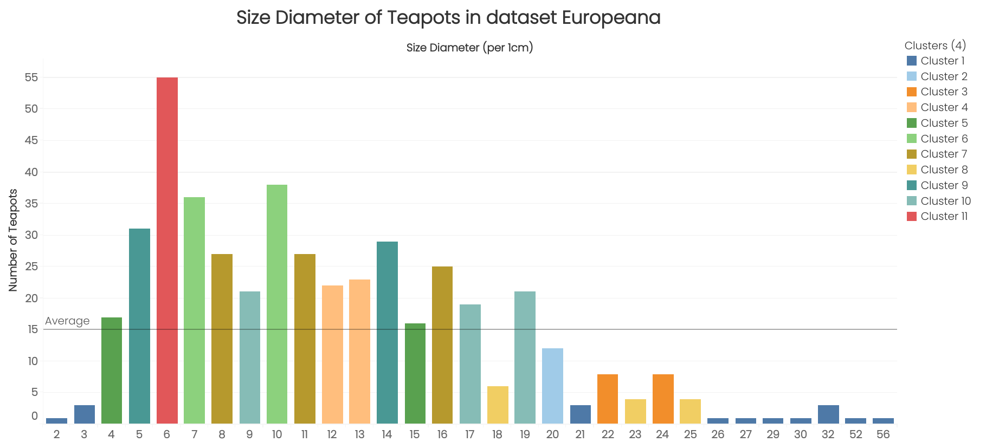

If we repeat this proces for the average side size that we calculated earlier (in Excell), we get the following graph:

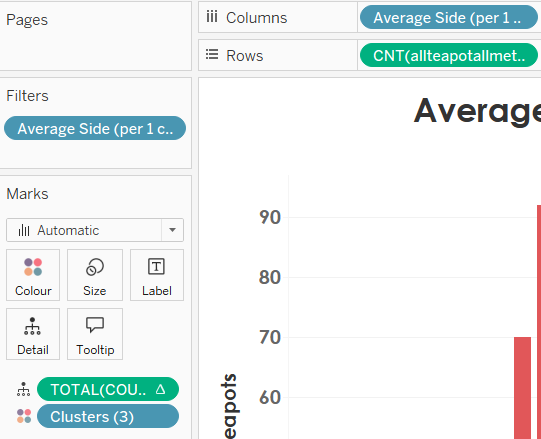

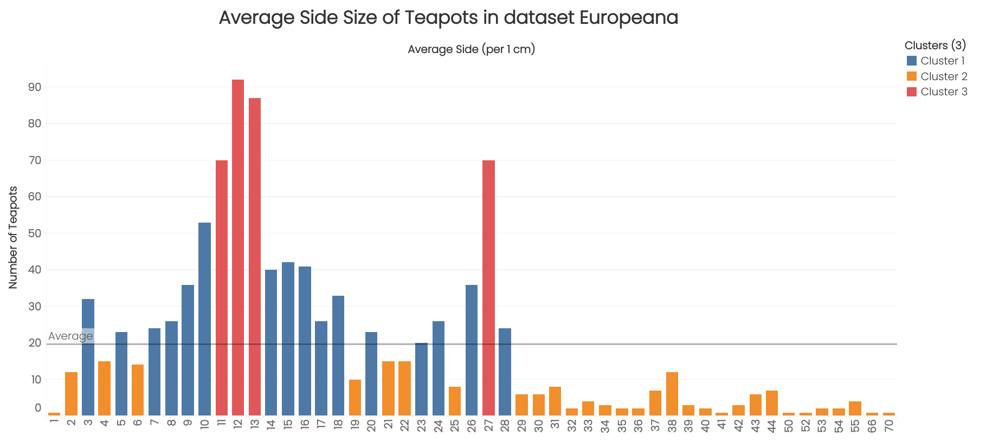

**Multi-dimensional graph?**

I could not figure out how to combine these into a single chart. I wanted to for example combine the length, height and width as several 3 dimensional points, and possible map them over time or over country, but I did not find a solution that made this possible yet. Another fact is that the datasets are very small and very limited. Most have only one value filled in.

I tried to work with average side size to combine all these values into a single value. That is the farthest I could get for now. It alreadt combines three or four variables into one variable value, and it also shows this value over time. I hope this represents enough of the data to make an interesting analysis. More work could be done in the future, for example a more interesting way to visualize bar charts.

##### **Analysis**

If we look at the data about size, we can conclude several things. First of all we see that there is not a lot of data available about length. We can also conclude that there is length, width, height and diameter all give very different values and mean/average sizes.

If we look at the average side size we can see two hotspots around 11-13cm and around 26-28cm. This indicates two groups of different teapot sizes. Do these have different functions? Have teapots grown or shrunk over time? How can we explain these two values.

#### **Sheet 27-29: Size over Time**

In this part I will look at the size over time of teapots in our dataset and I will look at the size per country. To do this I will create a heatmap and a highlight table.

First I put the average side size in the columns and the year of origin in the rows. Next I selected the heatmap. Cnt(allteapots) automatically gets a colour and size mark. I added a label mark.

I also added filters for year and side to remove some extreme values, and to remove nulls/blanks and 0 values.

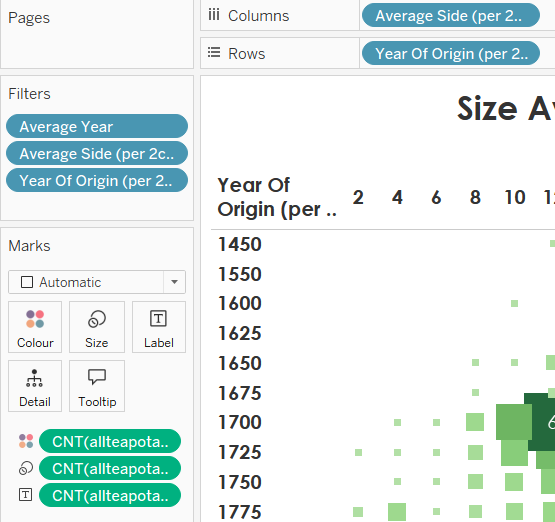

This results in the graph below:

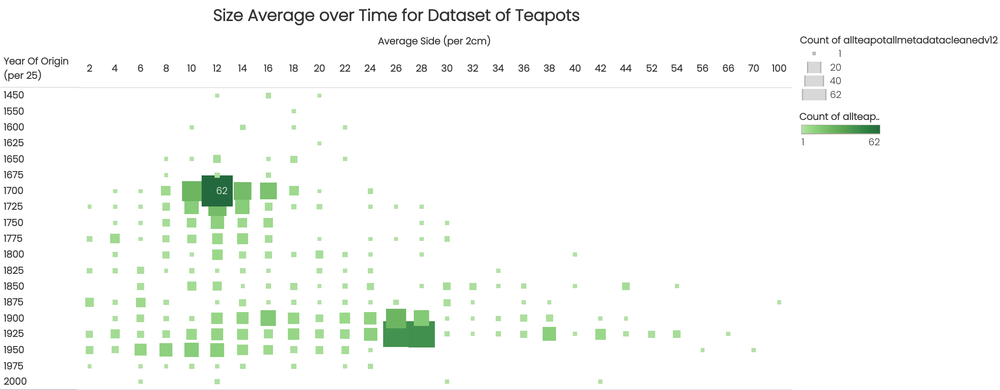

Next I also made a highlight table to show the average side sizes per country. Together with the graph above we get information about our dataset regarding size, country and time.

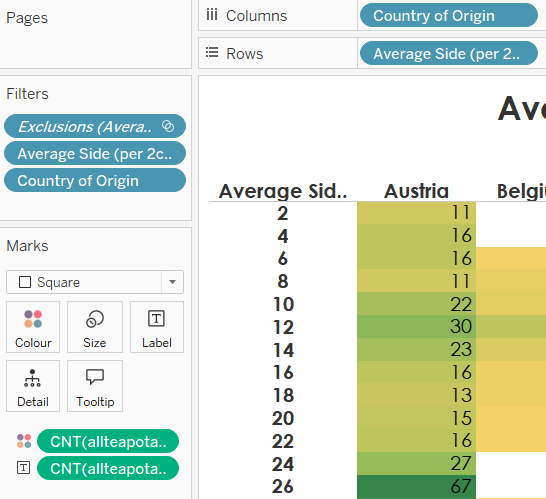

This results in this highlight table.  

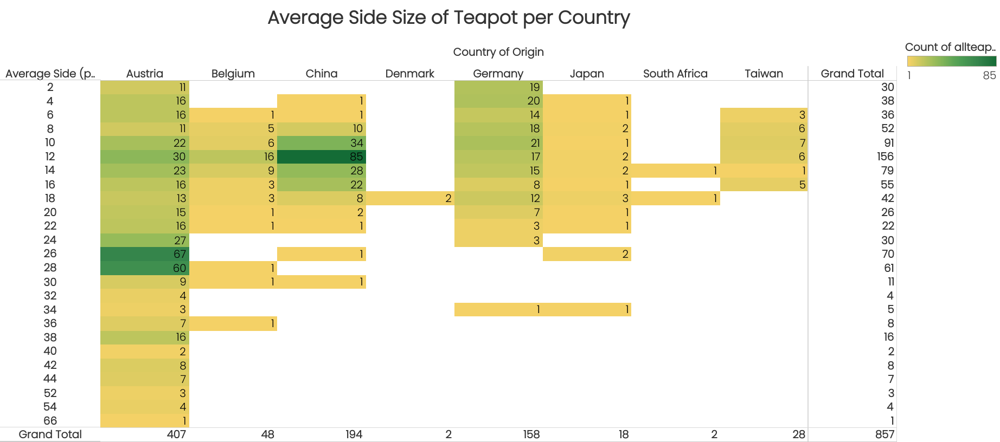

Next I also wanted to visualize the data in another way. Here I choose to create a stacked bar chart to see the contribution of each country for each size. It is interesting to see the datasets of countries spread in a different way. We can immediately see an interesting difference between China and Austria.

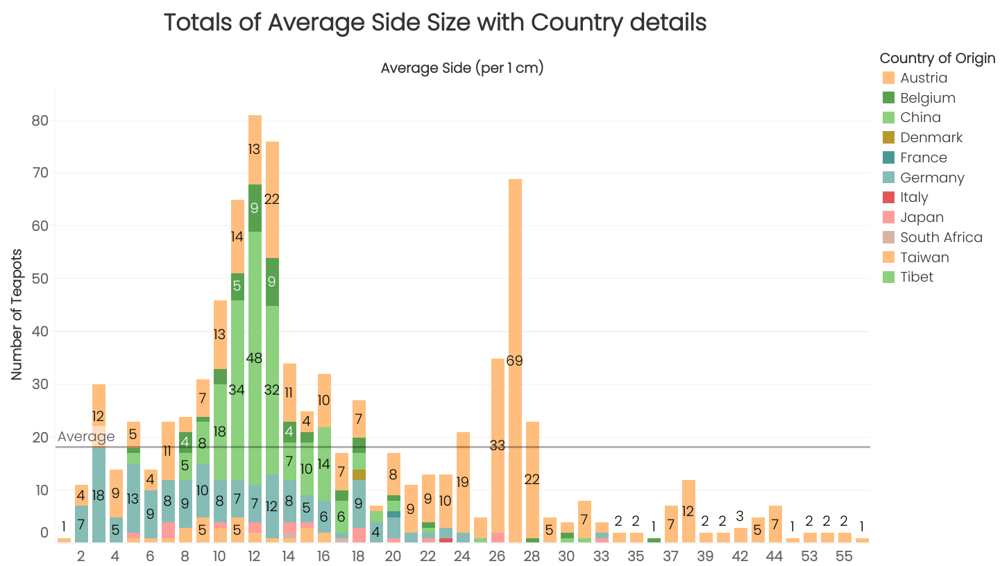

##### **Analysis**

Here we can expand on the previous analysis of size related data. Here we can add info about country and year. If we look at the heat map, we can see two hotspots. Around 1700, size 12 and around 1925-1950 with size 26-28cm. This already gives an indication that average sizes change over time and that teapots have become bigger over time.

Next we can wonder if this differnce is also bound by country. If we look at highlight table or stacked bar chart, we can see that teapots with an average of 28cm are mostly from Austria. Here we also see that most of the teapots with an average size of 12cm are from China. Teapots in china are overal smaller than those from Austria. As we also know that these pots come from different a different period of time, this may lead to multiple explanations of how and why this difference is so across country and across time.

#### **Sheet 30: A geographical representation of lack of data**

The last sheet I want to dedicate to the struggles I had with the lack of data on Europeana. I have a lot of records on teapots, but most of the times not a lot of data is provided about them. (Or did something go wrong with the extraction methods?)

In what follows below I give an example of the many possibilities to make visualisations about the lack of data on Europeana. In this case I focus on the lack of data about size in the records that have a country provided to them. This way we can see in which countries the most data lacks about size (on the condition that the data has information about the country).

To do this, I use the settings below. I put the country of origin in the columns and the cnt(allteapots) in the rows. Then I ask to create a map in the chart menu. This puts longitude and latitude in their place. This automatically created a detail mark for country of origin and a color mark for cnt(allteapots). Next I drag the Average size per cm in as a detail mark. In the filter section I put a filter on the Average size (per 1 cm). I only want to see the blank values and 0 values, nothing else. After that I put a label mark on the cnt(all teapots) to see the number per country on the graph.

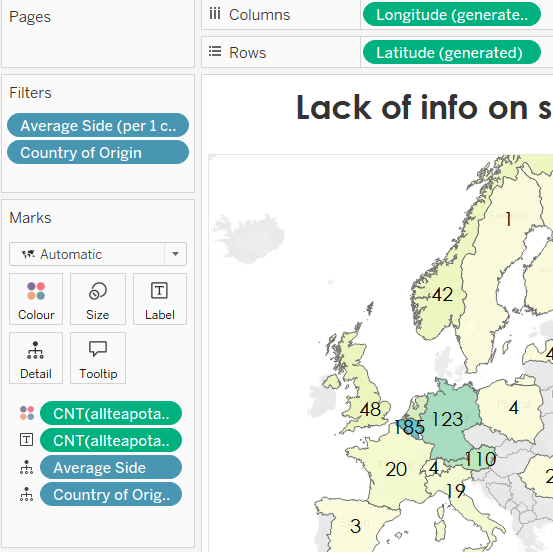

This results in the graph below to see the number of teapots that lack data about size per country. Note that country of origin has to be available to be able to show the lack of size data. Austria has more records than Belgium about teapots (around 500 compared to 284), but Belgium has more lack of data regarding size than Austria (185 compared to 110).

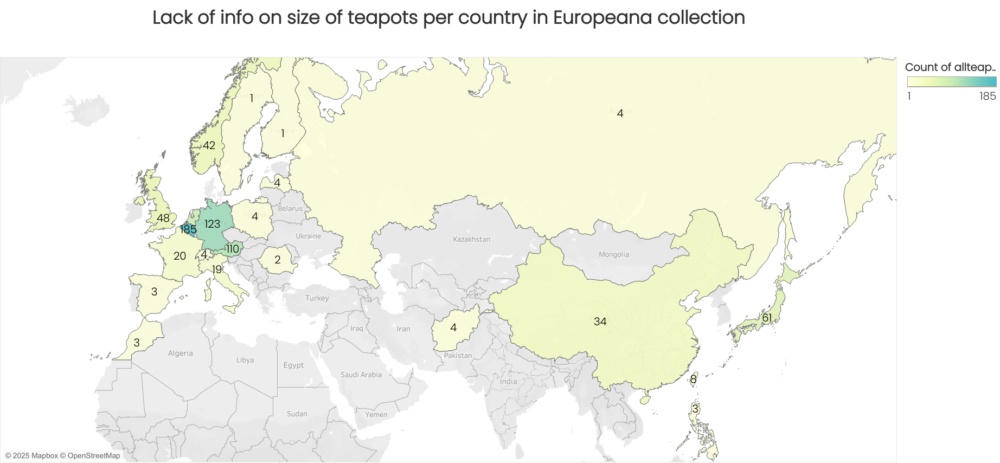

##### **Analysis**

In this case it is interesting to see (and maybe not such a surprise) that most of data lacking is in countries we have most data from. Earlier we concluded that top contributors are from Austria (110), Germany (123) and Belgium (185). It seems the collections from these countries lack some data about the size of the teapots. Interesting may be that items in China and Japan also lack some data. These teapots can be in a collection of another country (we only see the country of origin here). It is also not clear if most of these lacks are within certain collections or spread over all, but this can be expected in some cases and some degree. Still, it is interesting to note that though Belgium lacks more size related data than Austria, there are more teapots from austria than from Belgium. This indicates that certain lacks are not proportional to their amount of records.

The beginning of a reaearch on its own? This research might be even more valuable, as now we can start seeing where we lack data. This is the most interesting aspect for Europeana itself, as this indicates where more work needs to be done. Of a lot of places in the world we do not have any data about teapots. Are there no teapots? Is Europeana mostly Eurocentric? Is there a language barrier? Many of these questions need to be researched and can be with data extractions such as these. We also have a lot of data in some countries, but there also lacks some in these same countries. Can we ask them to improve their data? Does Europeana want to focus on more than the quantity of data, and start investigating the quality of their data more? Is data with a lot of blank values useable and representative? Many of these questions are very difficult, but can be the philosophical seed to change and improve Europeana even more.

### 3.2.1.B Layout in Tableau

In this part I want to explain how I made my layout for my charts. I have kept the layout fairly simple. I choose for a Century Gothic style font, and a size of 12 pt, and sometimes added a bold text. I adjusted axis names (renaming, resizing) and added labels. I experimented a lot, but decided to keep it simple here.

The workflow in Tableau is to click on all the elements you see and select format (by right-clicking). On the left you get a panel where you can change layout elements, such as headers and bodies, and change parameters such as color, font, and so on.

Luckily we do not need to adjust all fields by hand. We can simply select and adjust the sheet style in general to have a certain format and adjust small things in a later phase.



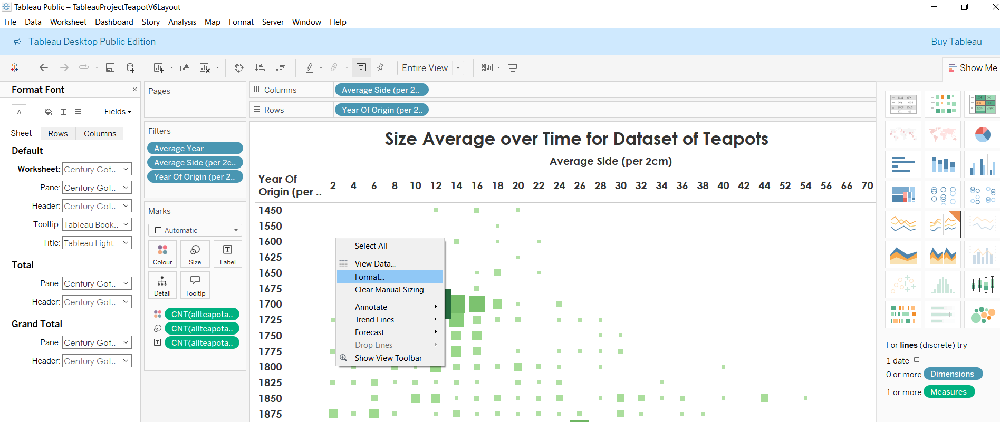

If you click on format, you get a dropdown menu at the left of your screen. Here you can adjust several aspects of the layout.

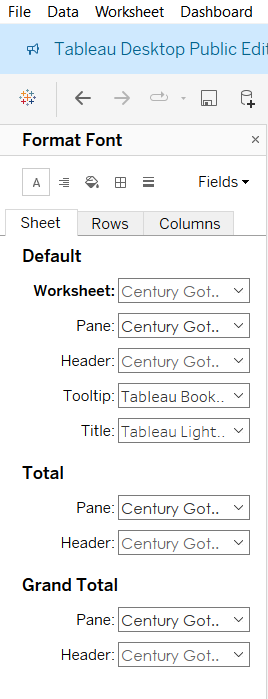

You can select 'sheet' and then make the default 'Century Gothic 12'. Now all fonts will be this type and size on your sheet. You do not have to select each field separately this way.

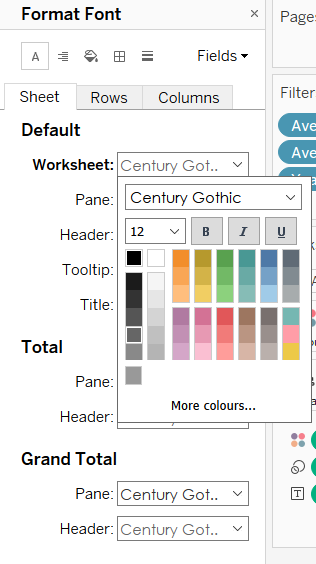

- **Change title**

To format the title I clicked on it and selected 'edit title'. Here I opted for bold, font type Century Gothic, Size 16 and centered to the middle for all sheets.

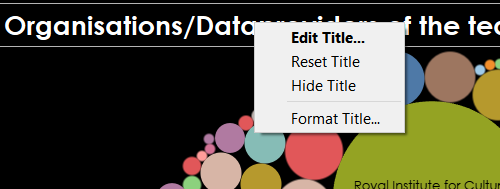

- **Change legend**

by clicking on the legend(s) you can format them (see image below). I change the header and body font type and size to Century Gothic, and size 12-20pt

**- Adjust colors**

by clicking on the legends you can re-edit the color or resize weights.

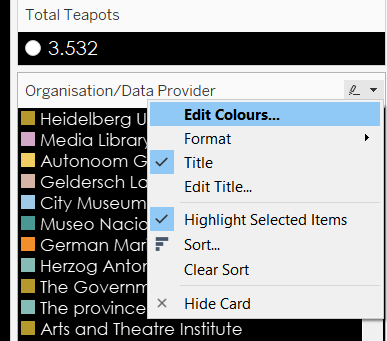

**- edit and format axis.**

By right-clicking on an axis, you can edit it. Here you can choose a custom name for your axis. Font and size can be changed in the formatting section.

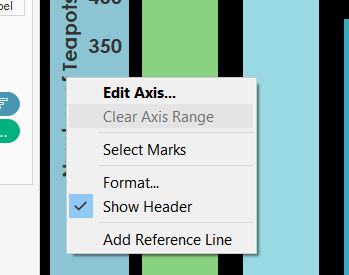


**- edit alias**

You can also edit the name of an individual values, such as a country name, a material, organisation name etcetera. To do this you simple right click on the name and choose 'edit alias'. Now you can change the name of that

example: For some reason one of my cities is league of nymphenburg, which I can change to 'Nymphenburg' via the 'edit alias'.

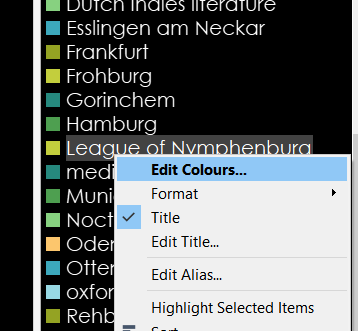

**- excluding values**

Another important step is cleaning the visualisations by excluding the null, blank or 0 values. This can be done by clicking on values and choosing 'exclude'.

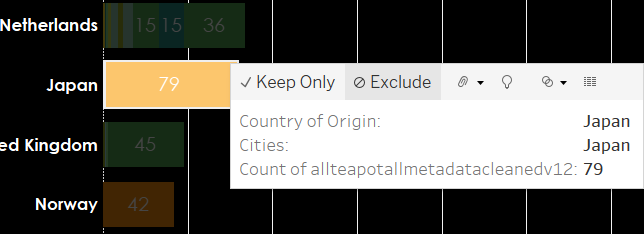

**- adjust label colour**

You can click on label marks to choose a font, size and colour for your labels. In the image below this would change the '79' (and other numbers).

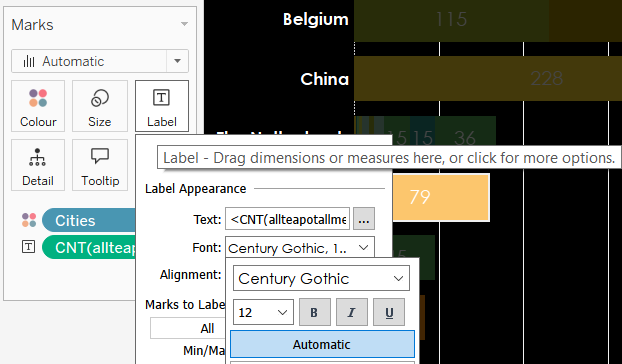

**- dual axis and synchronize**

Sometimes it happens that two graphs are created in the sheets, for example with the europeana timestamps. There we plotted a the number of records created over time, and the number of records updated of time. We did this by pasting cnt(allteapots) in the rows and dragging the timestamps into the columns.

We get 2 graphs next to eachother. If we click on the axis of the second graph, we can select dual axis. This places one axis on top and one below.

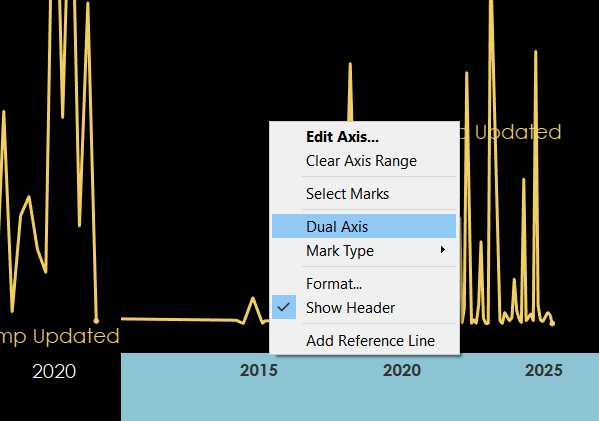

In this case both axis on top and below represent the same timeline. For this reason we can synchronize them, so that the two graphs overlay on the same scaled axis.

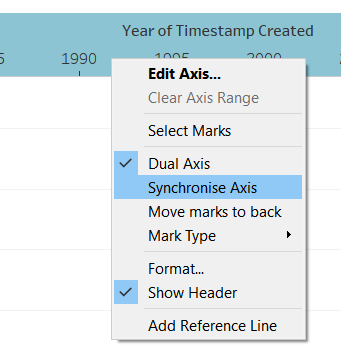

**- make bold of values grand total**

In some graphs I added a grand total (for example in highlight tables). The format can be adjusted. In this case I put these values bold, so they stand out more in the visualisation.

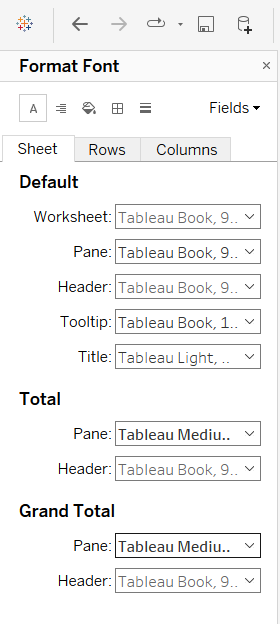

**- Remove grid**

To remove the grid of a graph or lines surrounding a graph on a sheet, one can select the grid (square symbol) or the three lines symbol. Here one can find all panels to adjust layout regarding the lines of a graph. This can make a visualisation look less chaotic and more clean. Each element should contain information and if that is not the case, it can be deleted.

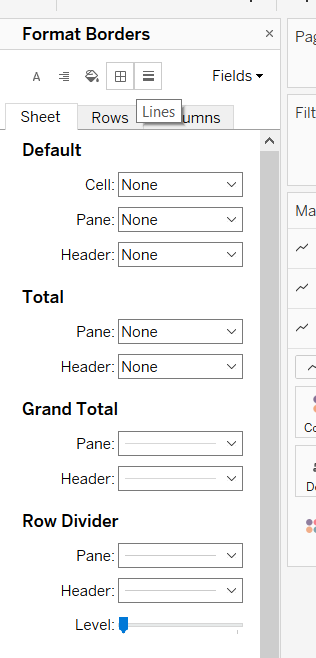

**- change font and sheet background to white and black**

Lastly, I changed all the worksheet backgrounds to black and the fonts to white. To do this I used the A symbol to change the fonts and the bucket symbol to change the shading of the sheets to black.

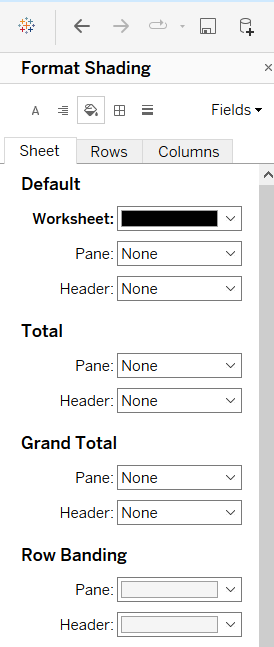

## 3.2.2 Dashboards

Now that we have created multiple sheets in Tableau on the basis of our dataset, the next step will be to assemble them into collective overviews, or so-called dashboards. In other words: it is a combination of sheets. A dashboard is often the final visualisation product that is shown to a client to discuss data analysis. In what follows, I will try to create several dashboards. In the end dhe goal will be to combine multiple dashboards into a story in a later part.

it might be that we have to create some more sheets to make fully functional dashboards. If this is the case, we will tackle the problem when it needs to.
Another thing I already want to point out, is the use of interaction in these dashboards. In what follows, I hope to make an interactive dashboard, where the visualisation reacts on what you click, in this way showing different data and insights.

### Dashboard 1 : Licenses Overview

A first dashboard I wanted to create shows an overview of the rights and licenses that are associated with the records of teapots in the dataset extracted from Europeana. I show a set for all records, for records related to Creative Commons and records related to Rights Statements. The public domain records have been joined together between sets, because the source of these was not always clear. The timeline and map on the right are clickable and can function as filters for the donut charts. Here we just see the image so this is not possible.

To create this, I first created a new dashboard. From here on it was simply placing several sheets we made earlier together. It feels a bit like laying a puzzle. From the dropdown menu on the left you can also add other elements than sheets, such as text blocks. This way I created a title and info text for each dashboard.

You can chose these elements in the bottom left corner menu:


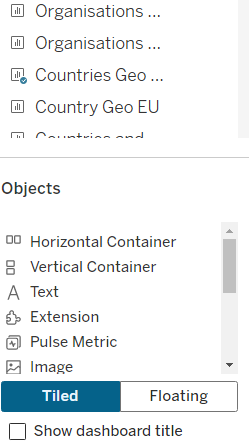

After some puzzling and adjusting, this results in this dashboard. I decided to put the three donuts central and put a map and timeline on the side to use as filters.

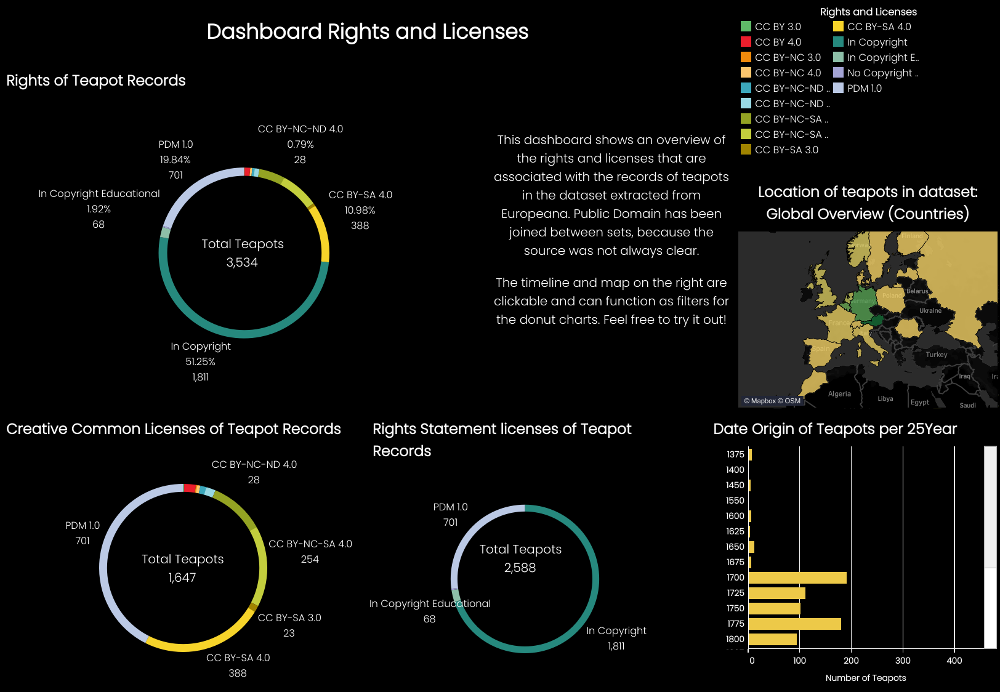

**Donut chart**

For this dashboard I decided to change the pie charts into donut charts. This was not that hard, but you need some acquantaince with Tableau to do this. I watched this video that explains the process very well.

link: https://www.youtube.com/watch?v=ZfpUzp8mBSw

A donut chart consists of a pie chart with a circle placed on top. This is a second structure (see video).

To get the total teapots to show in the middle of the donut, I dragged the cnt(totalteapots) to the label mark of this object. I did this while I selected the object in the menu. In my case I took a window_sum to create the circle object. More info about this function can be found here: https://community.tableau.com/s/news/a0A4T000002OOOCUA4/total-vs-windowsum. I think you can also take a value as avg(0) to create the shapes (again, see video).

I also decided to add a percentage value, instead of only a total value, as pie charts or donut charts are often expressed in proportions. This might give some new insights.


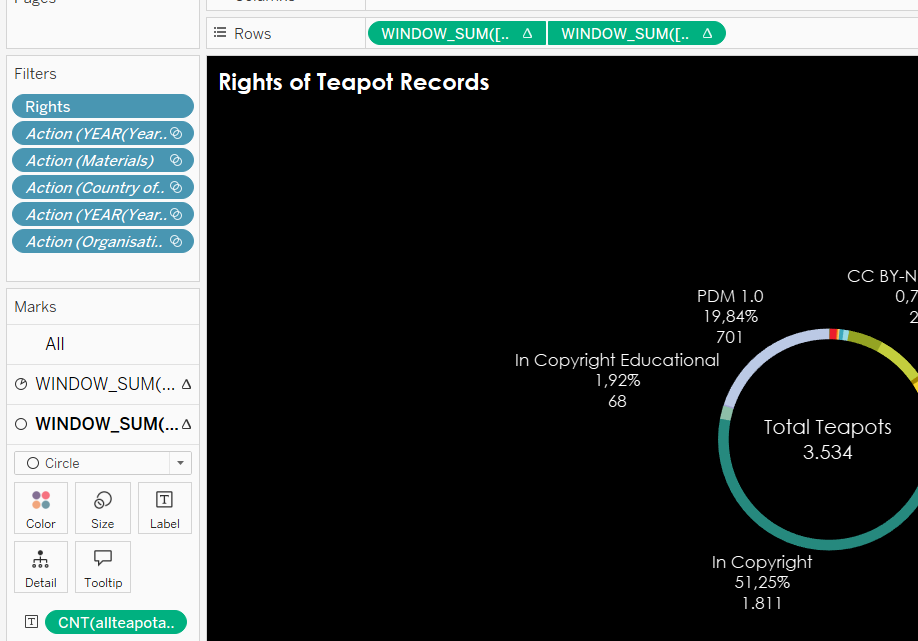

**Analysis**

Interesting to note is that around 20% of the teapot records are public domain. Public Domain aside, around 53% is under Rights Statements and 27% is under Creative Commons. If we click on Austria on the map (which has a high number of records), we will see that around 99,8% is not under the public domain!

### Dashboard 2: Organisations Overview

This dashboard shows an overview of the organisations that contributed to the dataset of teapot records on Europeana. The timeline, bubble pack and bars work as filters and are interactive by clicking on them. The dashboard below is an image extraction, so the interaction is not possible.

To create this dashboard, I again copied some sheets to their appropriate place and added some text fields for a description and a title. I also sorted the legend and bubble pack on count of teapot records to get the nice shape. On the left is a clickable timeline to filter.

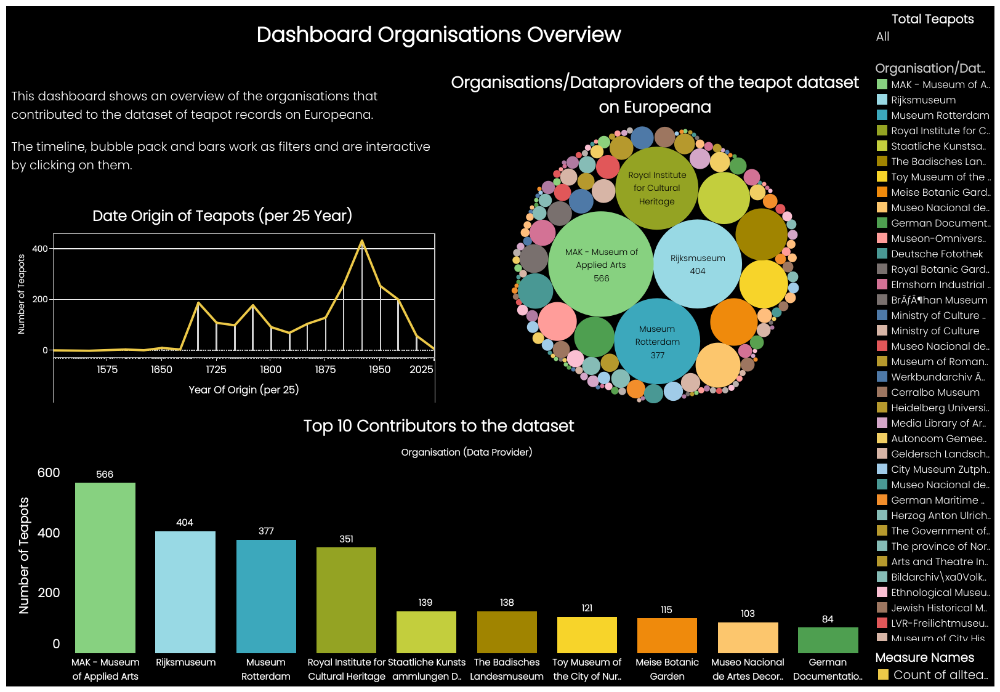

**How to use/set interactive filters?**

If you click on one of the organisations, you will see that all other graphs change as well. This is because this graph/sheet serves as a filter. To do this, you can simply hoover over the sheet in your dashboard, or click on it. On the top right, you see the symbol for the filter. If you click on it, it will become active (and become white). If you now click on one of the organisations in the sheet, it will be highlighted and all other graphs in the dashboard change accordingly (if possible).

We repeat this process for all other sheets, so that all of them are in this case clickable and interactive.



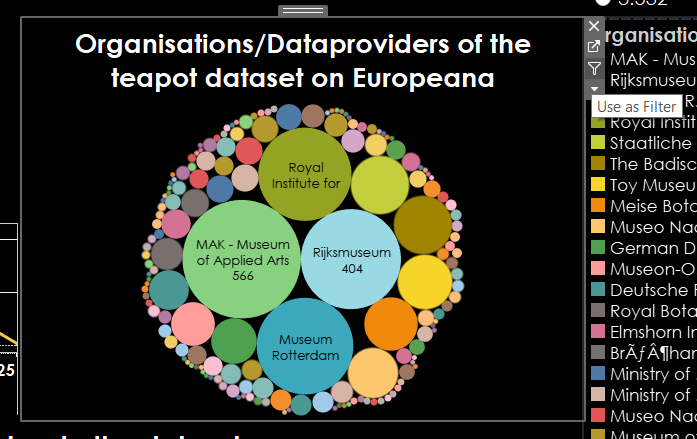

**Analysis**

First of all we can see that Royal Institute for Cultural Heritage, MAK, Rijksmuseum and Museum Rotterdam contributed most. If we click on Rijksmuseum, the other graphs will show that most of their records date objects from 1750-1800. If we click on MAK, we will see that most of their records date to object from around 1925. This way we can analyze differences between collections of organisations.

### Dashboard 3: Size Overview

This dashboard is an overview of the size data related to the teapot records in the dataset extracted from Europeana. The timeline and map on the right are interactive, and can be used as filters by clicking on a country of a year. The size charts can also be used as interactive filters. This can be done by clicking on one of the size measures, the other graphs will change accordingly.

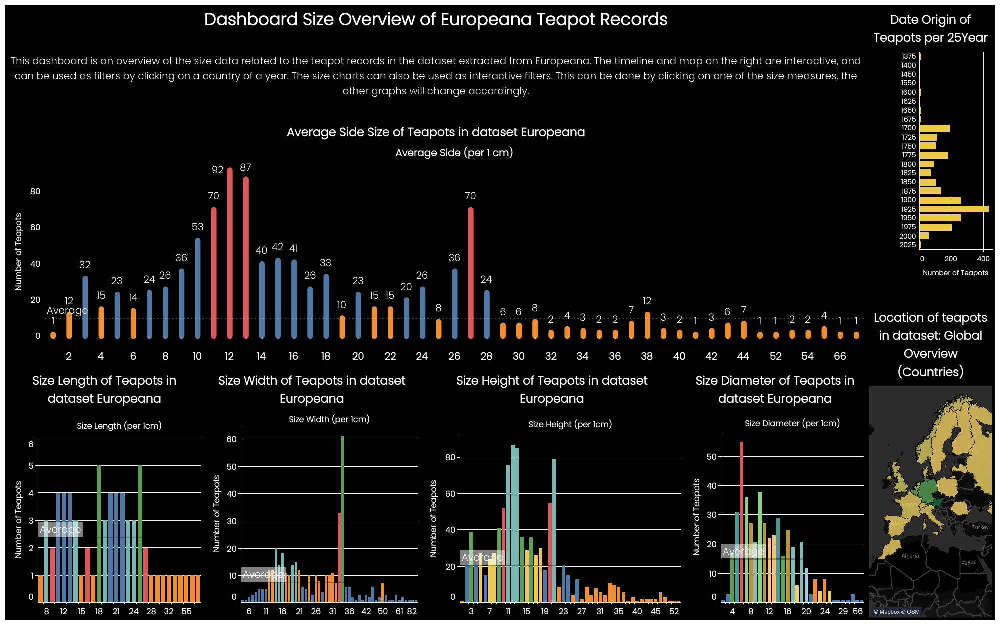

**Rounded bar chart**

Next I wanted to change the look of a 'boring' barchart. Something I saw while scrolling Tableau Public Discovery, was a rounded bar chart. It looked more esthetically pleasing. I used the tutorial below. It was not that hard at all.

link: https://www.analyticsvidhya.com/blog/2021/02/create-rounded-bar-chart-tableau/

To save some time, and create the contrast with the other graphs, I only did this for the average side size. Above you can see the result.

**Analysis**

first we can conclude in general that there are two spikes around an average side size of 12cm and 27cm. If we click on Austria again, we will see that the average side size there has a high number of records with a 27cm average side size. If we click on China on the map, we will see that there is a high number of average side size of 12cm. This way we can analyse differences in size per country.

### Dashboard 4: Size-Country-Time Analysis

This dashboard shows size data of the teapot records dataset from Europeana in relation to country and date of origin. All visualisations are interactive filters and clickable.

You can click on the year or size of the heat map or click on a square.  You can also click on a country, size or square of the highlight table. On the right one can also click on the stacked bar for a size and/or country. Lastly, one can select a country on the map on the right.




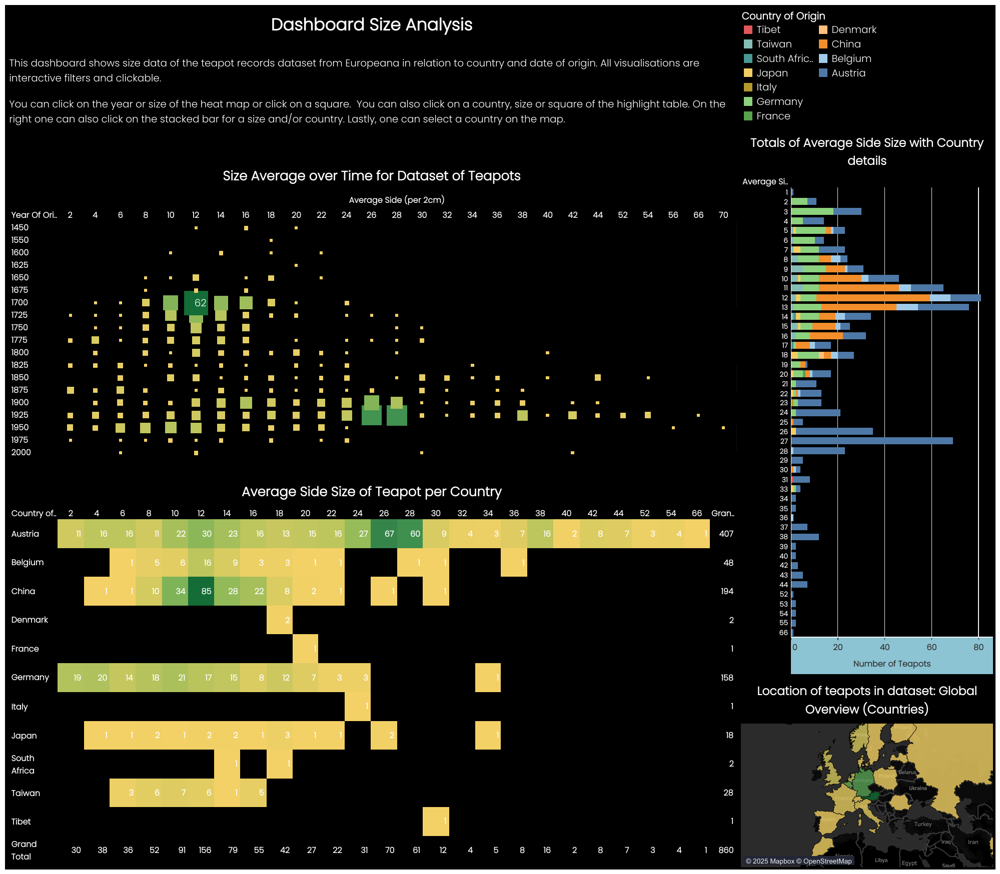

**Creating Sets (remove nulls/blanks)**

Next I still had a problem with a lot of my sheets. That was that if I used a sheet as a filter in my dashboard: If i click on for example the map and on Germany, then I select only info from Germany. But, if I deselect Germany to see all data again, it also resets earlier filters I made in the separate sheets. For example: I set some filters in the sheets to filter away nulls or extreme filters (which indicate errors), but if I select and deselect a filter in my dashboard, these will show up again in the visualisations.


To solve the problem, I discovered you can make so called 'sets'. It is hard to explain, but has to do with hierarchy in the Tableau ontology. It can filter on a higher level, which makes it permanently filtered in the dashboard, independent from any other filtering you do afterwards, for example via the dashboard.

I used this guide to help me: https://www.youtube.com/watch?v=3W-9mIR3BYI

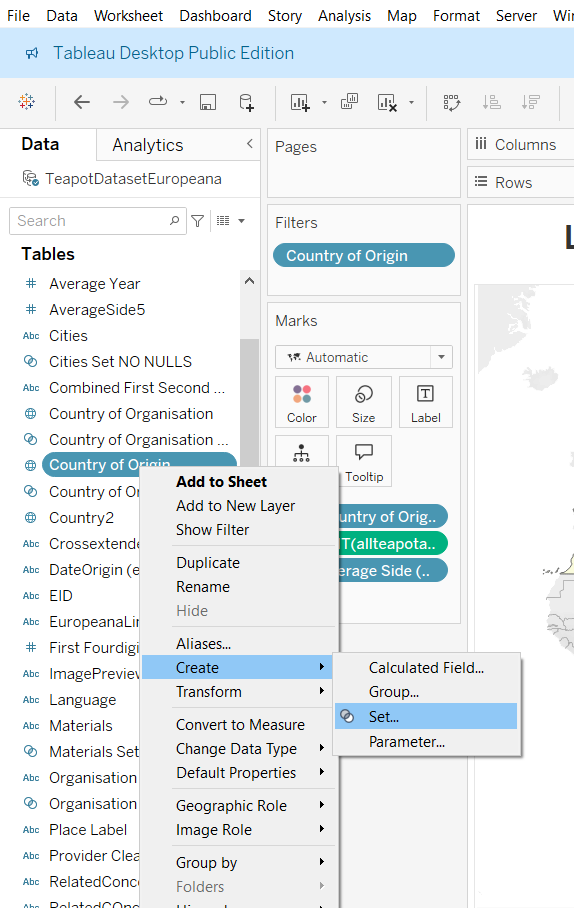

This means that If you create a set, you also create a new dimension to work with.

> example: 'country3' gets a duplicate that I can give a new name, such as 'country3NoNulls'.

In the menu I can - just as in any other filter in Tableau - select the values I want to include or exclude with the filter. This way the new dimension will never show me nulls in my visualisation in my dashboard, even after resetting the sheet as filter function. I did this for quite a number of dimensions and sheets, so that the visualisations in my dashboard always stay clean.

**Analysis**

If we look at the dashboard, and in particular the heatmap, we can see average size of 12 around 1700 and an average size of 26-28 around 1900. If we look at the highlight table, we see most records with around 12 cm average side size are from China, and most records with a size 26-28 come from Austria. To prove this suggestion, we can click on the data in the heatmap. If we click on the '62' records of average size 12, we can indeed see that most of them are from China. If we click on the heatmap square of 26 average size around 1925, we see most of these records are from Austria.

To make this analysis more easy, I added a size charts and a map on the right. This makes the use of the dashboard more easy. Time periods or year can still be clicked on the heatmap and highlight table.

### Dashboard 5: Location Overview

This dashboard shows the locations of the teapot items of the collection extracted from Europeana (Country/City). All visualisations are clickable, interactive and can be used as filters. You can click a country on the map and it wil show info about the cities related to it.

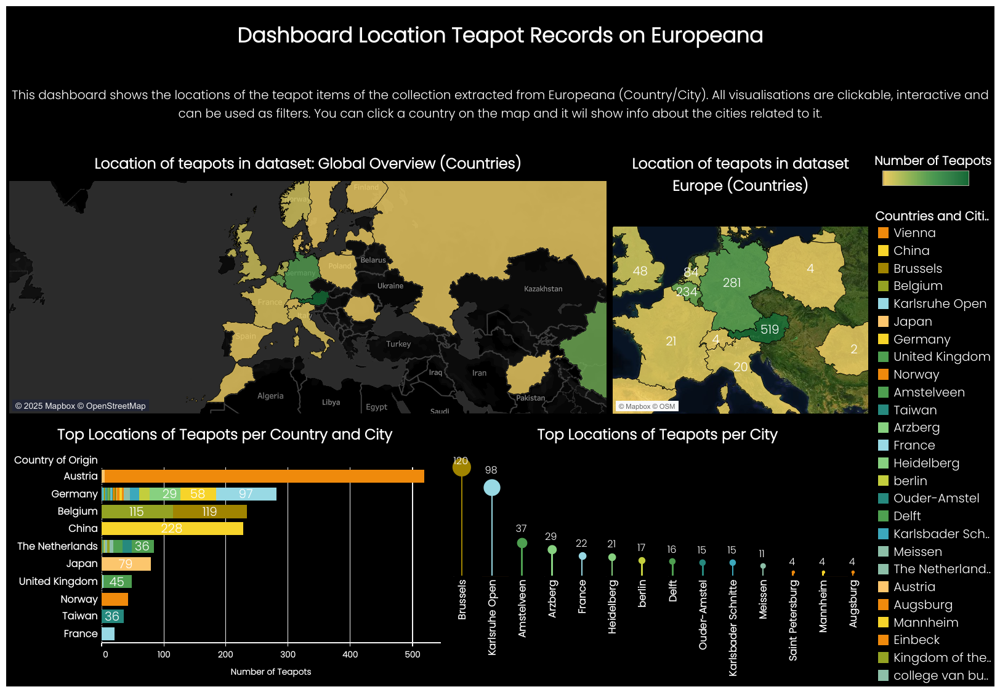

**Lollipop chart**

To make the barcharts of the cities more interesting, I created so called 'lollipop' charts. These are similar to a bar chart, but look a bit different. Conceptually speaking they are created by making a double chart in a sheet. This two charts are exactly the same bar charts, but one has the layout changed into circles at the endvalue. The other one is a bar chart of which the bars are made very thin via the size mark. If you combine the sticks with the balls, you get lollipops.

I used this tutorial to make them: https://www.tableau.com/blog/viz-whiz-when-use-lollipop-chart-and-how-build-one-64267

**Layout of Geomap**

Here I want to quickly explain how to change the layout of maps. If you select a map to visualize, it wil normally look like a white map (see image below). If you right-click on the map and select background layers, a menu will pop up on the left side of your screen. (This is the same place where normally also the layout and other actions are performed.)




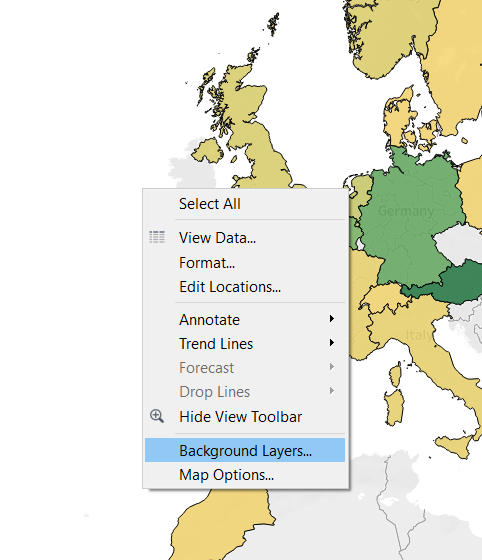

I used different layouts, namely the 'satellite' view and dark view, instead the white view. I did this by changing the style in the menu bar from light to dark or satellite. Other parameters can be changed here as , such as the transparancy.

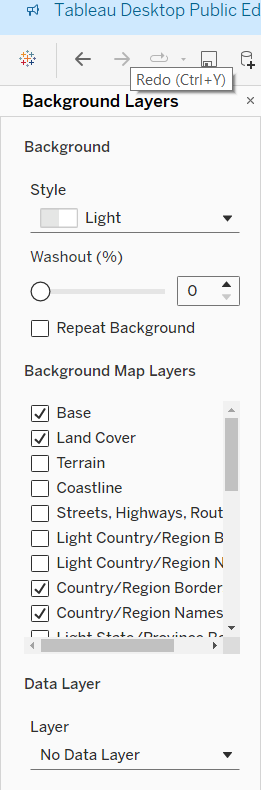

Below you can see the total worksheet with the selection of another style:

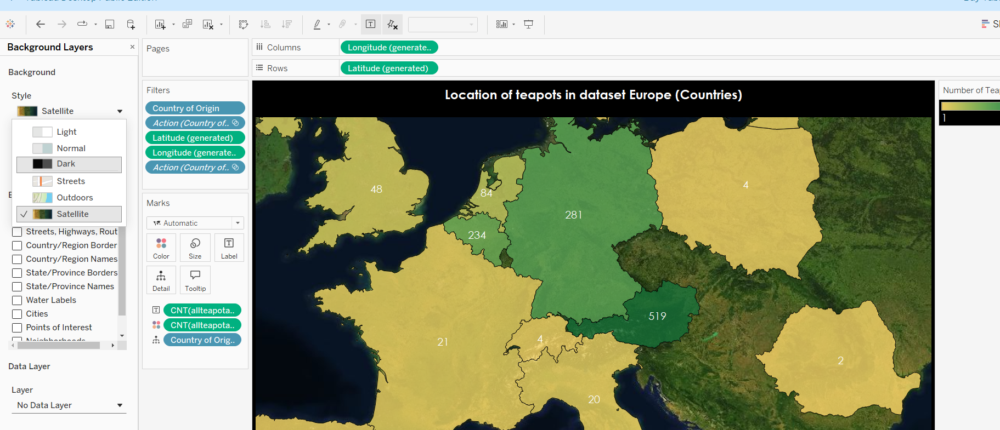

**Analysis**

If we look at the general map, we can see that there are a lot of records in Austria and Germany, among others. If we look at the cities, we see most records in Brussels (Belgium) and karlruhe (Germany). Germany has the best data to check per city. If we click on Germany we can see the division per city. Here we see all data for cities such as Karlruhe, Berlin, Arzberg, etcetera. Though countries such as Austria have many records, these are not specified to cities, except for one record of Vienna.

### Dashboard 6: Materials Overview

This dashboard gives an overview  of material related data of the teapot records on Europeana. All graphs can be used as interactive filters. If you click on years, materials or countries, the other graphs will change accordingly

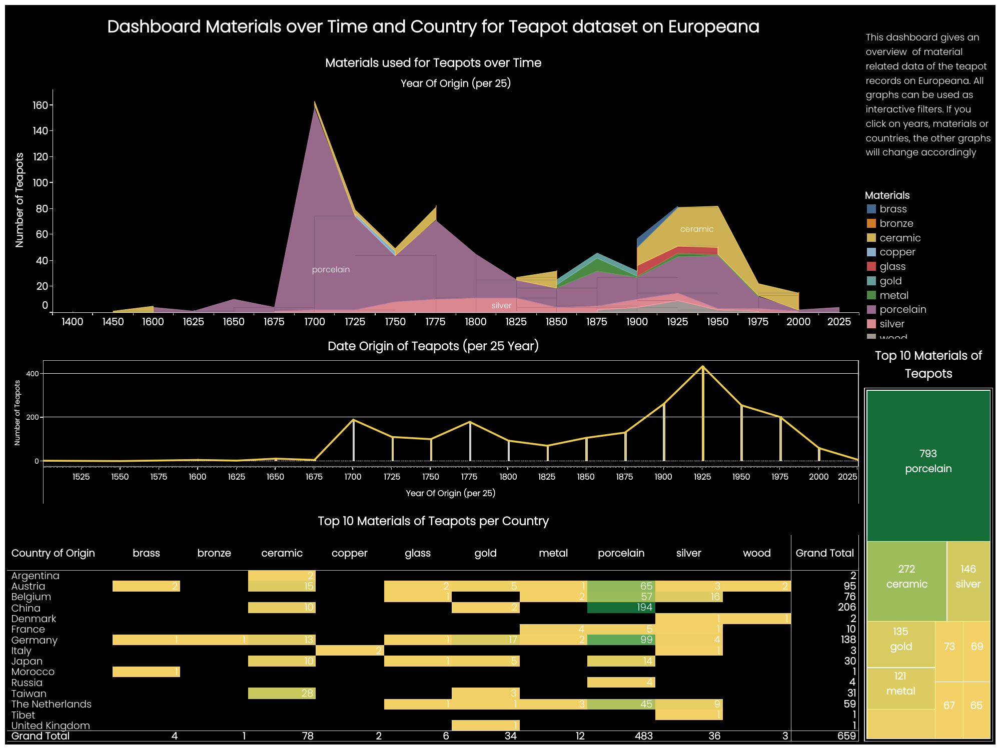

**Layout of Dashboards**

Something I want to point out here, is on how to change the layout of dashboards. One can simply click on a sheet and change it shading and font (see earlier). Another element is the background of the dashboard. If in this case, the background is not coloured, it will show as white stripes/lines between sheets and legends. This can be very annoying. It can be tricky to find a good place to click it the background to change the dashboard background. A good place to try is the top border/right corner. If you click it succesfully, you can go to the layout tab and menu to look for the background colour and change it to black (see image below):

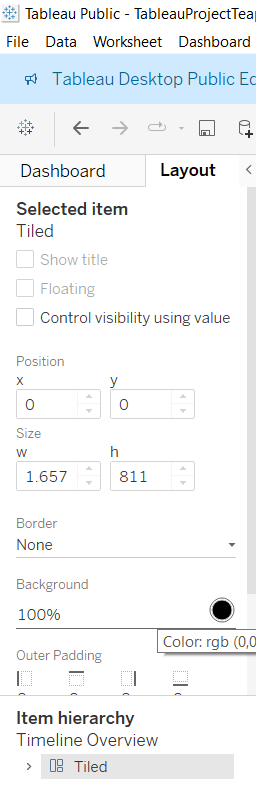

**Combination of bar and line chart**

You might have asked yourself already how I created the bar/linechart to show to year of origin of teapot records. To do this, I created two similar charts on 1 sheet. First I

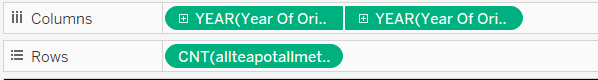

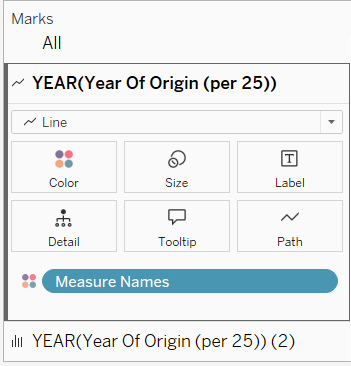

**Analysis**

### Dashboard 7: General Overview



To conclude I made an overview with some of the different graphs/sheets we made to give a total overview of aspects of the teapot records of our dataset. This dashboard gives an overview of some important aspects about teapot records in the dataset from Europeana. Each viz works as a filter that is clickable. You can click on the years, materials, organisations, countries and sizes.

I chose to show a timeline to select a time period to analyze data. I did the same for copyrights and for countries. All data can be analyzed in function of the other sheets.

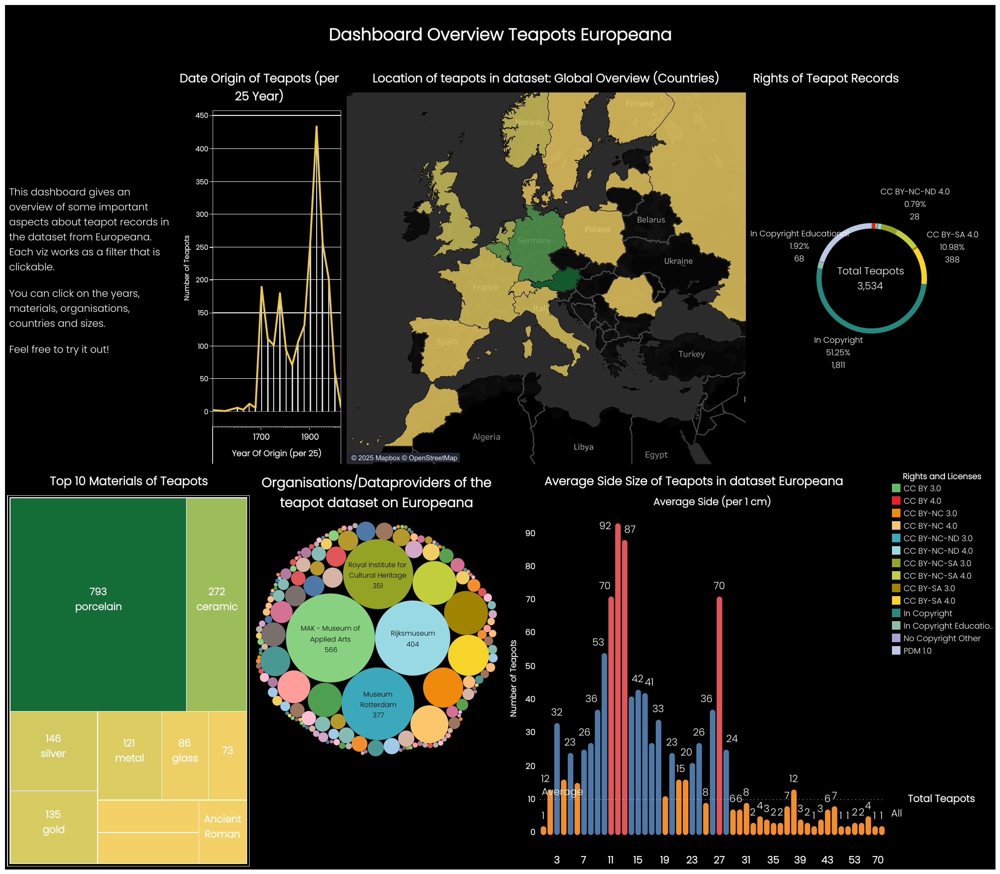

**Floater vs tile**

For your personal style, you might be wondering on how to move blocks/elements/sheets freely on your dashboards. This can easily be done by changing the property of that element. This can be done by clicking the floating option in the layout tab/menu on the left of the dashboard. This can also be done by clicking on a sheet or element in the dashboard and then right-click on the three lines at the top middle of the sheet (see image). Here you can also select the floater option.





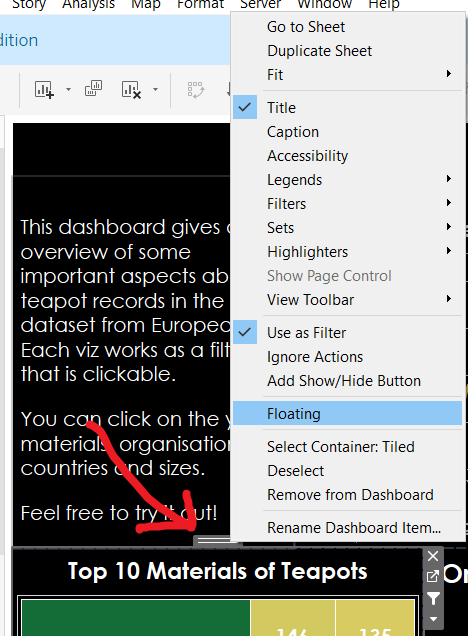

**Analysis**

If we try to analyse data via this dashboard, we can go several ways. We can choose one of the sheets and select one of the parameters. In this case I choose the material sheet and selected gold. the dashboard graphs get adjusted. This can be seen below:

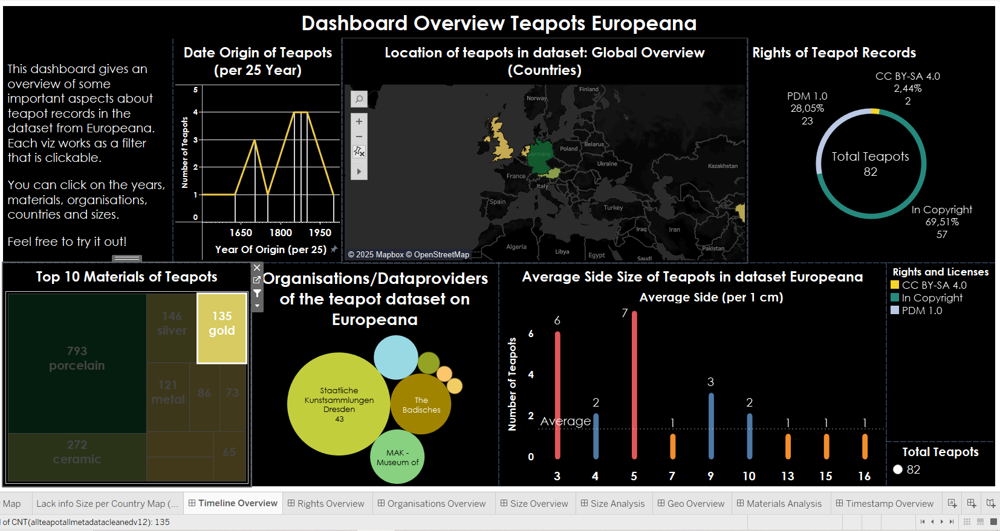

If we look at the sheets in function of the material gold, we can see several aspects. Most of the gold teapots come from 1850-1900. Most are from the organisation Staatliche Kunstsammlungen Dresden. The size is mostly around 3-5cm average side size. We might expect them to be smaller than average, because gold is a rare substance and not used for big objects. Most objects with gold come from Germany, in this case 17 records.

If we look at the copyrights, we might get a better insight in the real number of teapot records that contain gold. There is a difference in number between the copyright sheet and the materials sheet. This has to do with the division in records and rows in OpenRefine. It seems here that there are still some doubles in the material list. We can conclude this because the material list says 134 matches on the material gold, while the copyrights only show 82 records. This problably has to do with that the material field is less clean than the copyrights field. If we look at the rights we can conclude that 28% (or 23 records) are in the public domain.

### Dashboard 8: Timestamps Overview

As I had also worked with the timestamp data from these Europeana records, I also wanted to experiment with some dashboard about this information. Because there is accurate data, I hoped to achieve some different results than with the other dashboards.

This dashboard shows data related to the timestamp of the teapot record. This means when they are created on Europeana and when they are uploaded. The filter on the rights makes it possible to select a country for the big line graph. The country legend acts as a filter for the 2 graphs below. An addition could be the same two graphs for the time stamps updated.

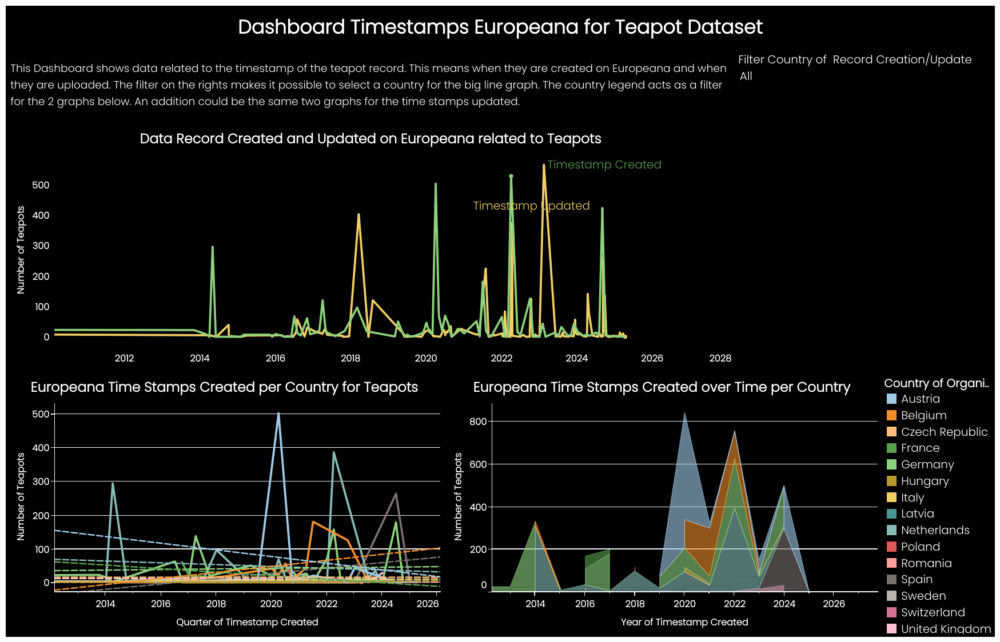

**Adding manual filter element**

On the image above you cannot see the manual filter I added. This is probably the case because I extracted the dashboard as an image file. If we look at the project on Tableau Public, we do see the filter. Below I will explain how I added this filter to the dashboard.



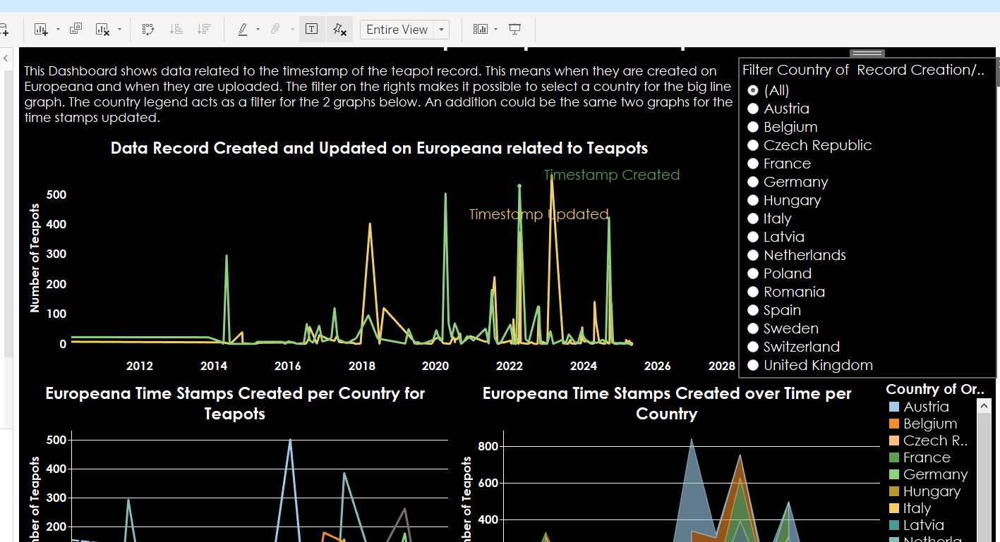

To add this filter, we can simply select this element in the dropdown menu of the dashboard on the left bottom corner of the Tableau screen. Here we can drop in a filter, just as we dropped in a vertical or horizontal container, or a text element (for our headers and descriptions).

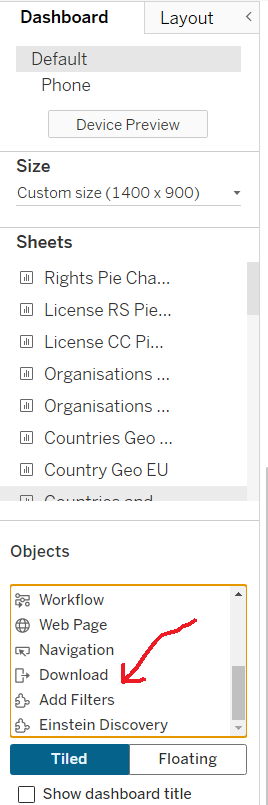

**Analysis**

Analyzing the data can be done by clicking a country in the added filter. This shows for example that Spain contributed a big set of teapot records around september 2024. For Austria we see that this is around april 2020. This way we can analyze the creation and update of records by countries. If we look at the difference between creation and upload, we can see that Spain updates are almost immediatly created and updated.This is not the case with Austria; there the update comes a couple years later. Because of these different visualisations we can get more information from the same data in a quicker way.

It would be nice to add some more visual numbers, for example some headers that immediatly show you the number of a clicked country. I was also not able to make all graphs interactive. The bottom two interact via the legend, while the top graph reacts on the filter on the right.

## 3.3 Summary

In the above I tried to experiment as much as possible with different visualisations that Tableau has to offer. We created line graphs, bar charts, stacked bar charts, tables and highlight tables, heat maps, geomaps, donut charts, lollipop charts, timelines, bubble packs, tile charts, and so on. There are many more possibilities, but here we already were able to create some essentials.

I have tried to add an interesting insight or technique to each of these dashboards in the hope to see the possibilities of Tableau. Via the Tableau Public platform many more ideas are shared and can be found to create some interesting charts and visualisations.

Example:
https://public.tableau.com/app/profile/lilla.rasztik/viz/Tutorialsofvisualizations/Tutorial


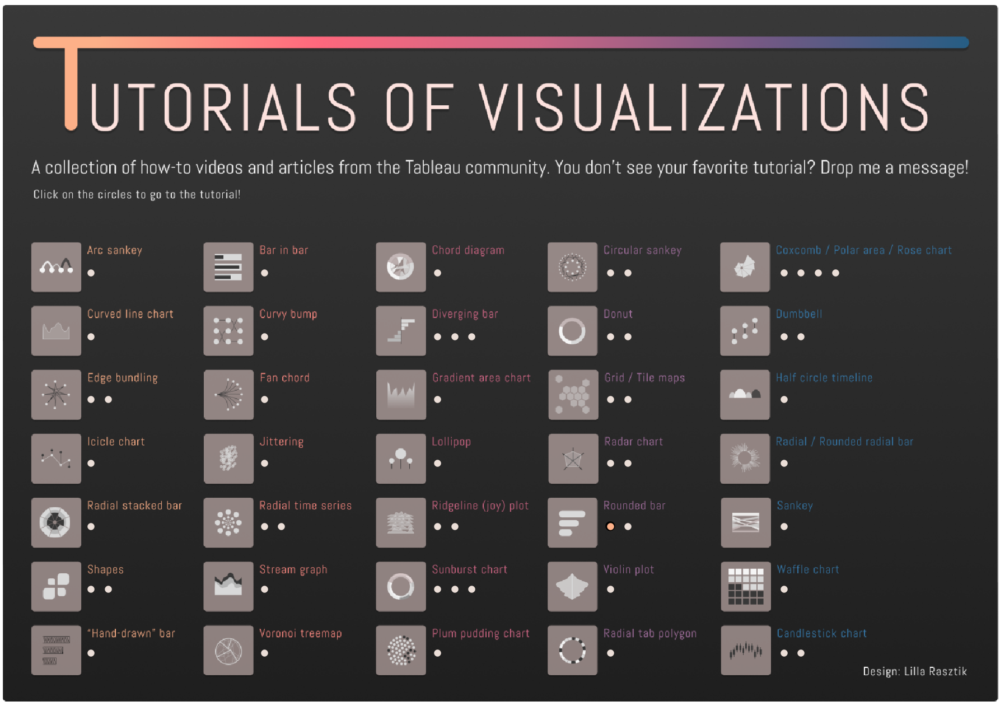

## 3.4 What's next?

In chapter four I will have a look at the visualisation of the images of the teapots. I will do this by looking at extraction of image urls, iiif manifests and iiif viewers such as Mirador or Universal Viewer.

In chapter four I will also show how to put the project on Github. I will also give an overview of the contents of this project in a repository on Github.